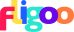

<hr>
<p style="font-size:40px;text-align:center">Take Home - Data Science</p>
<hr>

# The Hotel Bookings Data
Let’s use hotel bookings data from [Antonio, Almeida, and Nunes (2019)](https://www.sciencedirect.com/science/article/pii/S2352340918315191?via%3Dihub) to predict which hotel stays included children and/or babies, based on the other characteristics of the stays such as which hotel the guests stay at, how much they pay, etc.

<img src="https://s3-us-west-2.amazonaws.com/fligoo.data-science/TechInterviews/HotelBookings/header.png"/>

One of the hotels (H1) is a resort hotel and the other is a city hotel (H2). Both datasets share the same structure, with 23 variables describing the 19248 observations of H1 and 30752 observations of H2. Each observation represents a hotel booking. Both datasets comprehend bookings due to arrive between the 1st of July of 2015 and the 31st of August 2017, including bookings that effectively arrived and bookings that were canceled. Since this is hotel real data, all data elements pertaining hotel or custumer identification were deleted.

**Take-Home Goals**

#### Part 1
During **Part I**, you should perform an Exploratory Data Analysis highlighting key findings:
  - Data Quality Check: You must check the quality of the given dataset to make an assessment of how appropriate it is for later Data Science tasks. Propose a set of corrective actions over the data if any.
  - Report insights and conclusions: Describe the results obtained during the exploratory analysis and provide conclusions from a business perspective, supported by plots / tables / metrics.
  - **Expected**:
    - Make at least 10 plots with any ploting library (plotly, matplotlib, seaborn, etc.)
    - Write down the conclusions, in a clear manner, of every plot in this notebook

#### Part 2
In **Part II** you should define and train a model to predict which actual hotel stays included children/babies, and which did not:
  - **Feature extraction:** Indicate some possible candidates of features that could properly describe the hotels, either from the given columns or from their transformations.
      - **Expected**:
        - Create **one** scikit-learn pipeline inside a file called `pipelines.py`
        - Create at least **three** scikit-learn transformers inside a file called `transformers.py` and use them inside the pipeline from previous step. This transformers should add new features or clean the original dataframe of this take-home
          - Feature example: Compute "total_nights" feature. This is the sum of `stays_in_week_nights` + `stays_in_weekend_nights`
          - Cleaning example: Transform string values. `'0'` to int type `0` 
        - Import pipeline and run the transformations inside this notebook

  - **Machine Learning modeling:** Fit models with the given data. Pay attention to the entire process to avoid missing any crucial step. You could use the `children` column as target.
    - **Expected**:
      - Use the dataset with the new features generated to train *at least* **three** different machine learning models and generate metrics about their performance.
    
#### Part 3
Finally, on **Part III** you should present the key findings, conclusions and results to non-technical stakeholders.
  - **Expected**:
    - Create a summary of all the findings in part 1
    - Create an explanation of the features added in part 2
    - Create a summary of the model metrics
    - These explanations should be at high level and understood by a non-technical person
    - You can add all the summaries and explanations at the end of this notebook, it can be done in markdown format or any other external resource like a ppt presentation, pdf document, etc. Whatever works best for you!

 
**Requirements**
- Python 3.x & Pandas 1.x
- Paying attention to the details and narrative is far way more important than extensive development.
- Once you complete the assessment, please send a ZIP file of the folder with all the resources used in this work (e.g. Jupyter notebook, Python scripts, text files, images, etc) or share the repository link.
- Virtualenv, requirements or Conda environment for isolation.
- Have a final meeting with the team to discuss the work done in this notebook and answer the questions that could arise.
- Finally, but most important: Have fun!

**Nice to have aspects**
- Code versioning with Git (you are free to publish it on your own Github/Bitbucket account!).
- Show proficiency in Python: By showing good practices in the structure and documentation, usage of several programming paradigms (e.g. imperative, OOP, functional), etc.
- Shap Model explanability: explain feature importance with the use of shapley values

## Part I - Exploratory Data Analisys

# IMPORTS

In [1]:
import pandas as pd
# from pipelines import <your_pipeline_name>

In [2]:
pd.set_option('display.max_columns', 100)

In [3]:
import plotly.express as px
import numpy as np

In [4]:
import matplotlib
import matplotlib.pyplot as plt
import seaborn

In [5]:
import plotly.graph_objects as go

In [6]:
from sklearn.preprocessing import OneHotEncoder

In [7]:
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
from sklearn.pipeline import make_pipeline as make_pipeline_sklearn
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

In [8]:
import lightgbm as lgb
from lightgbm import LGBMClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, ConfusionMatrixDisplay
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression

In [9]:
from transformers import (
    RemoveDuplicatesTransformer,
    FilterDataTransformer,
    BoolDataTransformer,
    DateColsTransformer,
    TargetTransformer,
    TotalNightsTransformer,
    CountryTransformer
)

In [10]:
from sklearn.model_selection import ParameterGrid
from sklearn.model_selection import GridSearchCV

In [11]:
# pip install xgboost

In [12]:
from xgboost import XGBRegressor, XGBRFRegressor, XGBClassifier, XGBRFClassifier

In [13]:
# pip install imblearn

In [14]:
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import NearMiss

# READ DATA

In [15]:
hotels_raw = pd.read_csv('https://s3-us-west-2.amazonaws.com/fligoo.data-science/TechInterviews/HotelBookings/hotels.csv')

In [16]:
#
# Perform your exploratory data analysis...
#

In [17]:
hotels_raw.shape

(50000, 23)

In [18]:
hotels_raw.head()

,hotel,lead_time,stays_in_weekend_nights,stays_in_week_nights,adults,children,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,days_in_waiting_list,customer_type,average_daily_rate,required_car_parking_spaces,total_of_special_requests,arrival_date
0,City_Hotel,217,1,3,2,none,BB,DEU,Offline_TA/TO,TA/TO,0,0,0,A,A,0,No_Deposit,0,Transient-Party,80.75,none,1,2016-09-01
1,City_Hotel,2,0,1,2,none,BB,PRT,Direct,Direct,0,0,0,D,K,0,No_Deposit,0,Transient,170.00,none,3,2017-08-25
2,Resort_Hotel,95,2,5,2,none,BB,GBR,Online_TA,TA/TO,0,0,0,A,A,2,No_Deposit,0,Transient,8.00,none,2,2016-11-19
3,Resort_Hotel,143,2,6,2,none,HB,ROU,Online_TA,TA/TO,0,0,0,A,A,0,No_Deposit,0,Transient,81.00,none,1,2016-04-26
4,Resort_Hotel,136,1,4,2,none,HB,PRT,Direct,Direct,0,0,0,F,F,0,No_Deposit,0,Transient,157.60,none,4,2016-12-28


In [19]:
hotels_raw.columns

Index(['hotel', 'lead_time', 'stays_in_weekend_nights', 'stays_in_week_nights',
       'adults', 'children', 'meal', 'country', 'market_segment',
       'distribution_channel', 'is_repeated_guest', 'previous_cancellations',
       'previous_bookings_not_canceled', 'reserved_room_type',
       'assigned_room_type', 'booking_changes', 'deposit_type',
       'days_in_waiting_list', 'customer_type', 'average_daily_rate',
       'required_car_parking_spaces', 'total_of_special_requests',
       'arrival_date'],
      dtype='object')

In [20]:
hotels_raw.isnull().sum()

hotel                               0
lead_time                           0
stays_in_weekend_nights             0
stays_in_week_nights                0
adults                              0
children                            0
meal                                0
country                           289
market_segment                      0
distribution_channel                0
is_repeated_guest                   0
previous_cancellations              0
previous_bookings_not_canceled      0
reserved_room_type                  0
assigned_room_type                  0
booking_changes                     0
deposit_type                        0
days_in_waiting_list                0
customer_type                       0
average_daily_rate                  0
required_car_parking_spaces         0
total_of_special_requests           0
arrival_date                        0
dtype: int64

In [21]:
hotels_raw.dtypes

hotel                              object
lead_time                           int64
stays_in_weekend_nights             int64
stays_in_week_nights                int64
adults                              int64
children                           object
meal                               object
country                            object
market_segment                     object
distribution_channel               object
is_repeated_guest                   int64
previous_cancellations              int64
previous_bookings_not_canceled      int64
reserved_room_type                 object
assigned_room_type                 object
booking_changes                     int64
deposit_type                       object
days_in_waiting_list                int64
customer_type                      object
average_daily_rate                float64
required_car_parking_spaces        object
total_of_special_requests           int64
arrival_date                       object
dtype: object

In [22]:
def summarize_dataframe(df):
    """
    Summarize the statistics of columns in a DataFrame.

    Parameters:
        df (DataFrame): The input DataFrame to be summarized.

    Returns:
        DataFrame: A summary DataFrame with columns:
            - 'dataFeatures': Column names
            - 'dataType': Data types of columns
            - 'null': Number of missing values in columns
            - 'nullPct': Percentage of missing values in columns
            - 'unique': Number of unique values in columns
    """
    summary_data = []

    # Iterate through each column in the DataFrame
    for col_name in df.columns:
        data_type = df[col_name].dtype
        count = df[col_name].count()
        null_count = df[col_name].isna().sum()
        null_percentage = round((null_count / len(df)) * 100, 2)
        unique_count = df[col_name].nunique()

        # Append column summary data to the list
        summary_data.append([col_name, data_type, count, null_count, null_percentage, unique_count])

    # Create a DataFrame with the summary data and set column names
    summary_df = pd.DataFrame(data=summary_data, columns=['column', 'dataType', 'count', 'null', 'null_%', 'unique'])
    
    return summary_df

In [23]:
summarize_dataframe(hotels_raw)

,column,dataType,count,null,null_%,unique
0,hotel,object,50000,0,0.00,2
1,lead_time,int64,50000,0,0.00,414
2,stays_in_weekend_nights,int64,50000,0,0.00,17
3,stays_in_week_nights,int64,50000,0,0.00,31
4,adults,int64,50000,0,0.00,5
5,children,object,50000,0,0.00,2
6,meal,object,50000,0,0.00,5
7,country,object,49711,289,0.58,154
8,market_segment,object,50000,0,0.00,7
9,distribution_channel,object,50000,0,0.00,5


In [24]:
hotels = hotels_raw.drop_duplicates()

In [25]:
hotels.shape

(43385, 23)

### Data Curation

Cambiamos el tipo de valor de algunas columnas para trabajar con más comodidad

In [26]:
hotels['children'] = np.where(hotels.children== 'children', 1, 0)

/tmp/ipykernel_78/1558344332.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  hotels['children'] = np.where(hotels.children== 'children', 1, 0)


In [27]:
hotels['required_car_parking_spaces'] = np.where(hotels.required_car_parking_spaces== 'parking', 1, 0)

/tmp/ipykernel_78/2013104738.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  hotels['required_car_parking_spaces'] = np.where(hotels.required_car_parking_spaces== 'parking', 1, 0)


In [28]:
hotels['arrival_date'] = pd.to_datetime(hotels['arrival_date'])

/tmp/ipykernel_78/4161754738.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  hotels['arrival_date'] = pd.to_datetime(hotels['arrival_date'])


Extraigo año y mes de la columna 'arrival_date'

In [29]:
hotels['year_month'] = hotels['arrival_date'].dt.to_period('M').astype(str)

/tmp/ipykernel_78/944431189.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  hotels['year_month'] = hotels['arrival_date'].dt.to_period('M').astype(str)


In [30]:
hotels['month'] = hotels['arrival_date'].dt.month 

/tmp/ipykernel_78/4260777068.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  hotels['month'] = hotels['arrival_date'].dt.month


## Data Analysis

In [31]:
hotels.head()

,hotel,lead_time,stays_in_weekend_nights,stays_in_week_nights,adults,children,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,days_in_waiting_list,customer_type,average_daily_rate,required_car_parking_spaces,total_of_special_requests,arrival_date,year_month,month
0,City_Hotel,217,1,3,2,0,BB,DEU,Offline_TA/TO,TA/TO,0,0,0,A,A,0,No_Deposit,0,Transient-Party,80.75,0,1,2016-09-01,2016-09,9
1,City_Hotel,2,0,1,2,0,BB,PRT,Direct,Direct,0,0,0,D,K,0,No_Deposit,0,Transient,170.00,0,3,2017-08-25,2017-08,8
2,Resort_Hotel,95,2,5,2,0,BB,GBR,Online_TA,TA/TO,0,0,0,A,A,2,No_Deposit,0,Transient,8.00,0,2,2016-11-19,2016-11,11
3,Resort_Hotel,143,2,6,2,0,HB,ROU,Online_TA,TA/TO,0,0,0,A,A,0,No_Deposit,0,Transient,81.00,0,1,2016-04-26,2016-04,4
4,Resort_Hotel,136,1,4,2,0,HB,PRT,Direct,Direct,0,0,0,F,F,0,No_Deposit,0,Transient,157.60,0,4,2016-12-28,2016-12,12


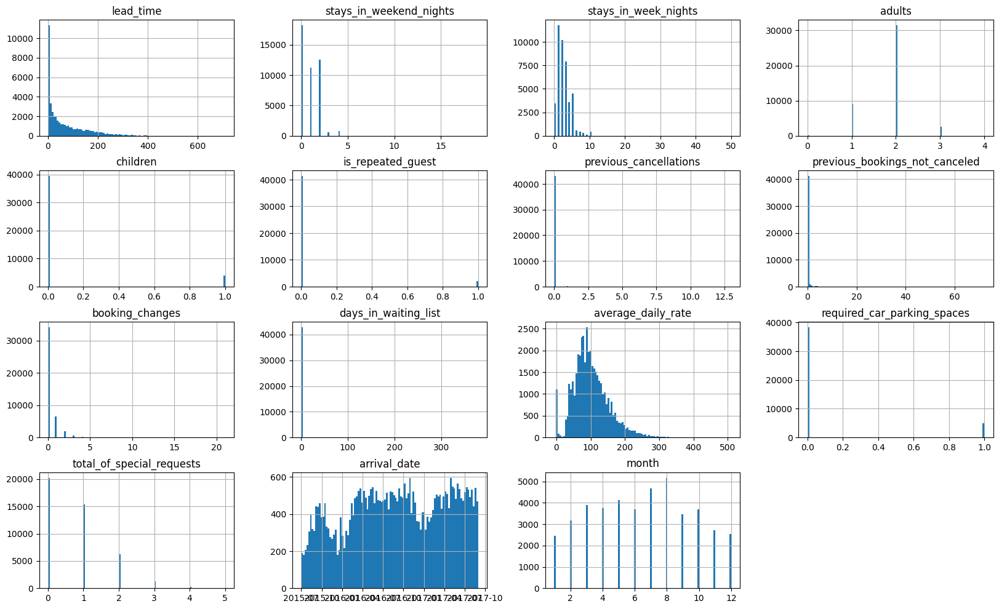

In [32]:
hotels.hist(figsize = (20, 12), bins = 100)
plt.show()

### Columns analysis

In [33]:
hotels[['lead_time', 'stays_in_weekend_nights', 'stays_in_week_nights', 'adults', 'previous_cancellations', 'previous_bookings_not_canceled',
       'booking_changes', 'days_in_waiting_list', 'average_daily_rate', 'total_of_special_requests']].describe()

,lead_time,stays_in_weekend_nights,stays_in_week_nights,adults,previous_cancellations,previous_bookings_not_canceled,booking_changes,days_in_waiting_list,average_daily_rate,total_of_special_requests
count,43385.000000,43385.000000,43385.000000,43385.000000,43385.000000,43385.000000,43385.000000,43385.000000,43385.000000,43385.000000
mean,71.310706,0.964250,2.517091,1.841627,0.019269,0.233168,0.313081,0.804402,101.591314,0.754016
std,82.579688,1.013571,2.004315,0.515454,0.308908,1.934391,0.771018,10.357164,50.947817,0.848370
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-6.380000,0.000000
25%,7.000000,0.000000,1.000000,2.000000,0.000000,0.000000,0.000000,0.000000,67.780000,0.000000
50%,39.000000,1.000000,2.000000,2.000000,0.000000,0.000000,0.000000,0.000000,94.500000,1.000000
75%,112.000000,2.000000,3.000000,2.000000,0.000000,0.000000,0.000000,0.000000,128.780000,1.000000
max,709.000000,19.000000,50.000000,4.000000,13.000000,72.000000,21.000000,379.000000,510.000000,5.000000


It seems to be some outliers in the data. I'll examine all columns individually

The 'average_daily_rate' column has negative values

In [34]:
hotels[hotels.average_daily_rate<0]

,hotel,lead_time,stays_in_weekend_nights,stays_in_week_nights,adults,children,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,days_in_waiting_list,customer_type,average_daily_rate,required_car_parking_spaces,total_of_special_requests,arrival_date,year_month,month
7858,Resort_Hotel,195,4,6,2,0,BB,GBR,Groups,Direct,1,0,2,A,H,2,No_Deposit,0,Transient-Party,-6.38,0,0,2017-03-05,2017-03,3


Es un solo registro, se va a eliminar

In [35]:
hotels.columns

Index(['hotel', 'lead_time', 'stays_in_weekend_nights', 'stays_in_week_nights',
       'adults', 'children', 'meal', 'country', 'market_segment',
       'distribution_channel', 'is_repeated_guest', 'previous_cancellations',
       'previous_bookings_not_canceled', 'reserved_room_type',
       'assigned_room_type', 'booking_changes', 'deposit_type',
       'days_in_waiting_list', 'customer_type', 'average_daily_rate',
       'required_car_parking_spaces', 'total_of_special_requests',
       'arrival_date', 'year_month', 'month'],
      dtype='object')

**Hotel**

In [36]:
hotels.hotel.value_counts()

hotel
City_Hotel      25713
Resort_Hotel    17672
Name: count, dtype: int64

In [37]:
hotels.groupby(['children']).hotel.value_counts(normalize=True)

children  hotel       
0         City_Hotel      0.593510
          Resort_Hotel    0.406490
1         City_Hotel      0.584396
          Resort_Hotel    0.415604
Name: proportion, dtype: float64

Los porcentajes se mantienen con y sin hijos

**lead time**

In [38]:
hotels.lead_time.value_counts()

lead_time
0      3770
1      1963
2      1197
3      1095
4       965
       ... 
400       1
709       1
454       1
382       1
424       1
Name: count, Length: 414, dtype: int64

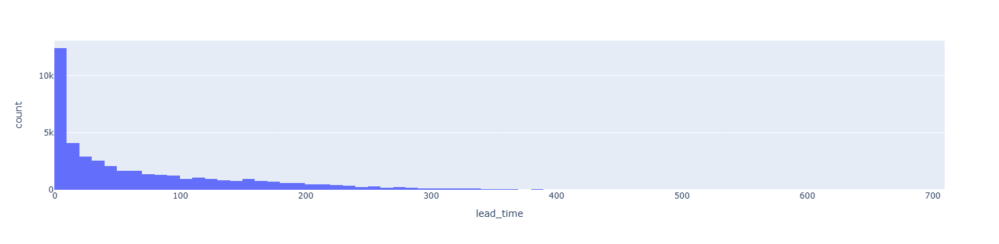

In [39]:
fig = px.histogram(hotels, x="lead_time", nbins=100)
fig.show()

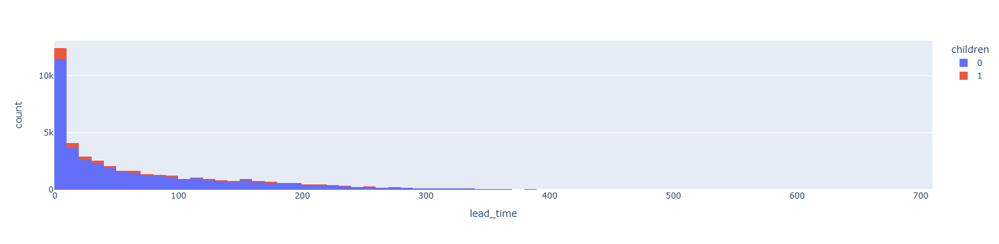

In [40]:
fig = px.histogram(hotels, x="lead_time", color = 'children', nbins=100)
fig.show()

La distribución es similar para reservas que tienen hijos y para las que no.

In [41]:
hotels.lead_time.describe()

count    43385.000000
mean        71.310706
std         82.579688
min          0.000000
25%          7.000000
50%         39.000000
75%        112.000000
max        709.000000
Name: lead_time, dtype: float64

In [42]:
hotels.lead_time.quantile([.03, .04, 0.045, 0.05, .10, .50, .90, .95, .96, .97, .99])

0.030      0.0
0.040      0.0
0.045      0.0
0.050      0.0
0.100      1.0
0.500     39.0
0.900    192.0
0.950    240.0
0.960    256.0
0.970    276.0
0.990    339.0
Name: lead_time, dtype: float64

**Weekends**

In [43]:
hotels.stays_in_weekend_nights.value_counts()

stays_in_weekend_nights
0     18163
2     12532
1     11252
4       806
3       541
6        35
5        21
8        18
10        4
12        2
14        2
9         2
16        2
13        2
7         1
19        1
18        1
Name: count, dtype: int64

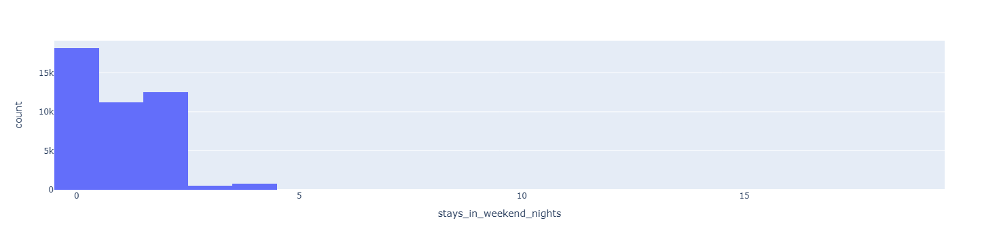

In [44]:
fig = px.histogram(hotels, x="stays_in_weekend_nights", nbins=20)
fig.show()

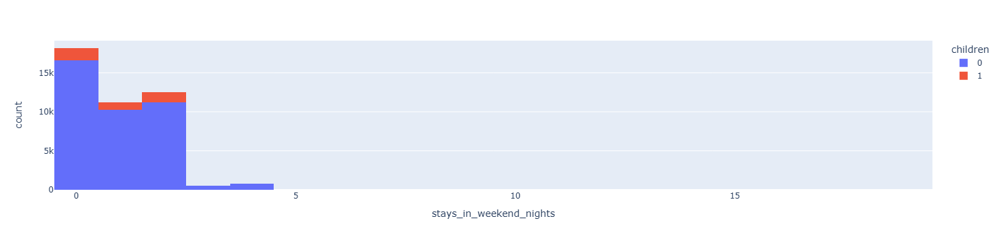

In [45]:
fig = px.histogram(hotels, x="stays_in_weekend_nights", color = 'children',nbins=20)
fig.show()

Las distribuciones son similares con y sin hijos

In [46]:
hotels.stays_in_weekend_nights.describe()

count    43385.000000
mean         0.964250
std          1.013571
min          0.000000
25%          0.000000
50%          1.000000
75%          2.000000
max         19.000000
Name: stays_in_weekend_nights, dtype: float64

In [47]:
hotels.stays_in_weekend_nights.quantile([.03, .04, 0.045, 0.05, .10, .90, .95, .96, .97, .99, .995, .998])

0.030    0.0
0.040    0.0
0.045    0.0
0.050    0.0
0.100    0.0
0.900    2.0
0.950    2.0
0.960    2.0
0.970    3.0
0.990    4.0
0.995    4.0
0.998    5.0
Name: stays_in_weekend_nights, dtype: float64

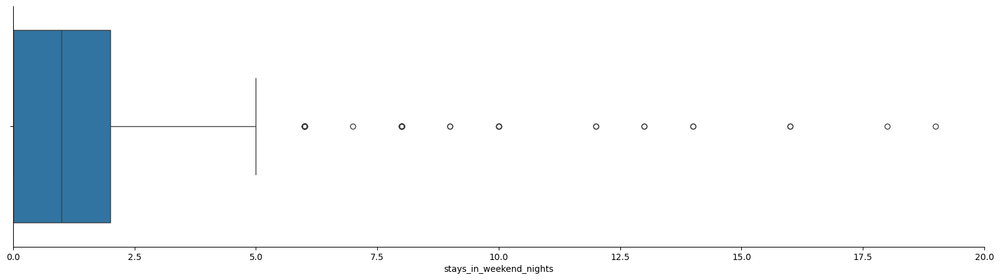

In [48]:
plt.figure(figsize=(20, 5))
seaborn.boxplot(x=hotels["stays_in_weekend_nights"])
plt.ticklabel_format(style='plain', axis='x')
plt.xlim(0,20)
seaborn.despine()

**Week nights**

In [49]:
hotels.stays_in_week_nights.value_counts()

stays_in_week_nights
1     11751
2     10199
3      7886
5      4473
4      3603
0      3442
6       597
10      478
7       466
8       295
9        99
15       22
20       18
12       11
11       10
13        6
19        6
16        4
25        4
21        2
17        2
30        2
50        1
35        1
42        1
14        1
34        1
40        1
33        1
41        1
32        1
Name: count, dtype: int64

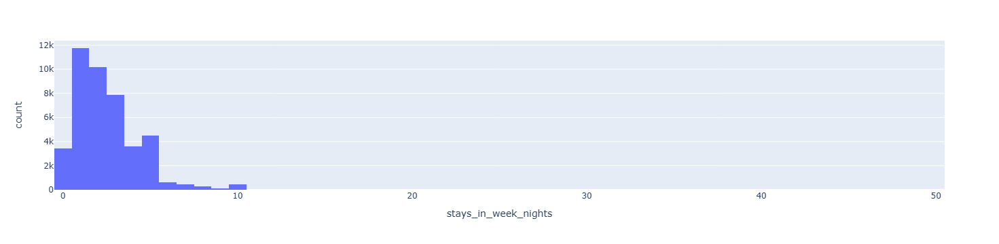

In [50]:
fig = px.histogram(hotels, x="stays_in_week_nights", nbins=100)
fig.show()

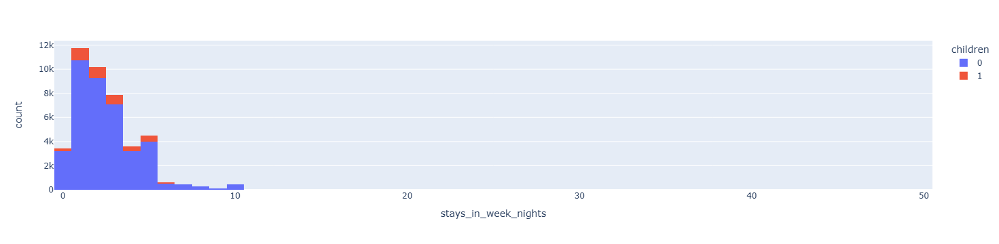

In [51]:
fig = px.histogram(hotels, x="stays_in_week_nights", color = 'children',nbins=100)
fig.show()

Distribuciones similares

**Adults**

In [52]:
hotels.adults.value_counts(normalize=True)

adults
2    0.724375
1    0.210764
3    0.059813
0    0.004379
4    0.000668
Name: proportion, dtype: float64

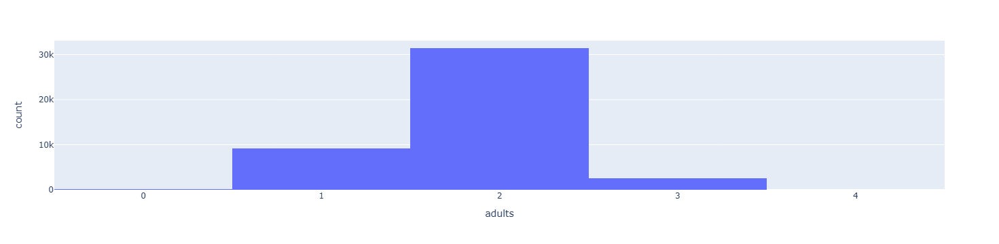

In [53]:
fig = px.histogram(hotels, x="adults")
fig.show()

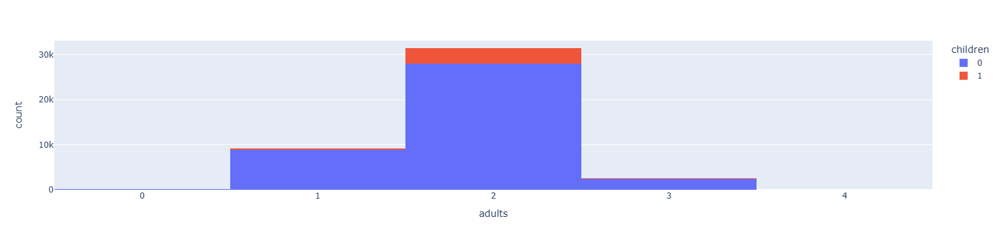

In [54]:
fig = px.histogram(hotels, x="adults", color='children')
fig.show()

In [55]:
hotels[hotels.adults == 0]

,hotel,lead_time,stays_in_weekend_nights,stays_in_week_nights,adults,children,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,days_in_waiting_list,customer_type,average_daily_rate,required_car_parking_spaces,total_of_special_requests,arrival_date,year_month,month
7,City_Hotel,56,0,3,0,1,BB,ESP,Online_TA,TA/TO,0,0,0,B,A,0,No_Deposit,0,Transient,82.44,0,1,2016-12-08,2016-12,12
92,City_Hotel,107,3,7,0,0,SC,FRA,Groups,TA/TO,0,0,0,A,K,3,No_Deposit,0,Transient-Party,0.00,0,0,2016-06-03,2016-06,6
160,City_Hotel,75,2,2,0,0,SC,GBR,Groups,TA/TO,0,0,0,A,K,3,No_Deposit,0,Transient-Party,0.00,0,1,2017-05-20,2017-05,5
864,City_Hotel,123,0,5,0,1,BB,FRA,Online_TA,TA/TO,0,0,0,B,B,0,No_Deposit,0,Transient-Party,81.50,0,1,2016-04-12,2016-04,4
1266,City_Hotel,177,2,2,0,1,BB,LUX,Online_TA,TA/TO,0,0,0,B,A,1,No_Deposit,0,Transient,103.05,0,0,2017-04-07,2017-04,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48748,City_Hotel,0,0,0,0,0,SC,PRT,Online_TA,TA/TO,1,0,0,A,K,0,No_Deposit,0,Transient,0.00,0,1,2016-10-28,2016-10,10
49595,City_Hotel,0,0,0,0,0,SC,PRT,Complementary,Direct,1,0,0,A,A,0,No_Deposit,0,Transient,0.00,0,0,2016-07-26,2016-07,7
49811,City_Hotel,5,0,5,0,1,BB,PRT,Complementary,Direct,0,0,0,B,B,1,No_Deposit,0,Transient,0.00,0,0,2015-12-22,2015-12,12
49912,City_Hotel,0,0,0,0,0,BB,PRT,Offline_TA/TO,TA/TO,1,0,0,A,D,0,No_Deposit,0,Transient,0.00,0,0,2016-12-20,2016-12,12


In [56]:
hotels[(hotels.adults == 0) & (hotels.children != 0)]

,hotel,lead_time,stays_in_weekend_nights,stays_in_week_nights,adults,children,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,days_in_waiting_list,customer_type,average_daily_rate,required_car_parking_spaces,total_of_special_requests,arrival_date,year_month,month
7,City_Hotel,56,0,3,0,1,BB,ESP,Online_TA,TA/TO,0,0,0,B,A,0,No_Deposit,0,Transient,82.44,0,1,2016-12-08,2016-12,12
864,City_Hotel,123,0,5,0,1,BB,FRA,Online_TA,TA/TO,0,0,0,B,B,0,No_Deposit,0,Transient-Party,81.50,0,1,2016-04-12,2016-04,4
1266,City_Hotel,177,2,2,0,1,BB,LUX,Online_TA,TA/TO,0,0,0,B,A,1,No_Deposit,0,Transient,103.05,0,0,2017-04-07,2017-04,4
2275,City_Hotel,70,0,4,0,1,BB,PRT,Offline_TA/TO,TA/TO,0,0,0,B,B,0,No_Deposit,0,Transient-Party,9.00,0,1,2016-04-12,2016-04,4
2338,City_Hotel,34,2,5,0,1,BB,BLR,Direct,Direct,0,0,0,B,A,1,No_Deposit,0,Transient,93.82,0,0,2017-03-21,2017-03,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45871,City_Hotel,1,4,9,0,1,BB,FRA,Direct,Direct,0,0,0,E,A,0,No_Deposit,0,Transient,0.00,0,1,2016-07-16,2016-07,7
46681,City_Hotel,21,2,1,0,1,BB,GBR,Online_TA,TA/TO,0,0,0,B,B,0,No_Deposit,0,Transient-Party,109.83,0,2,2016-08-20,2016-08,8
47392,City_Hotel,0,0,1,0,1,BB,PRT,Direct,Direct,1,0,1,A,A,1,No_Deposit,0,Transient,6.00,0,1,2017-01-21,2017-01,1
47519,City_Hotel,14,0,1,0,1,BB,BEL,Online_TA,TA/TO,0,0,0,B,B,0,No_Deposit,0,Transient,109.55,0,1,2016-08-17,2016-08,8


In [57]:
round((len(hotels[hotels.adults == 0]) / len(hotels))*100,2)

0.44

No tienen sentido las reservas que tienen 0 adultos. Como representan un porcentaje muy bajo, se van a eliminar esos registros

**Children**

In [58]:
hotels.children.value_counts(normalize=True)

children
0    0.907825
1    0.092175
Name: proportion, dtype: float64

**Meal**

In [59]:
hotels.meal.value_counts()

meal
BB           34011
HB            4677
SC            4220
Undefined      304
FB             173
Name: count, dtype: int64

According with the description of features in the paper " Hotel booking demand datasets ", the value "Undefined" is equal to "SC" and means no meal package. Thus, I will replace 'undefined' meal with 'SC'.

In [60]:
hotels['meal'].replace(to_replace = 'Undefined', value = 'SC', inplace = True)

/tmp/ipykernel_78/1262983433.py:1: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.



/tmp/ipykernel_78/1262983433.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



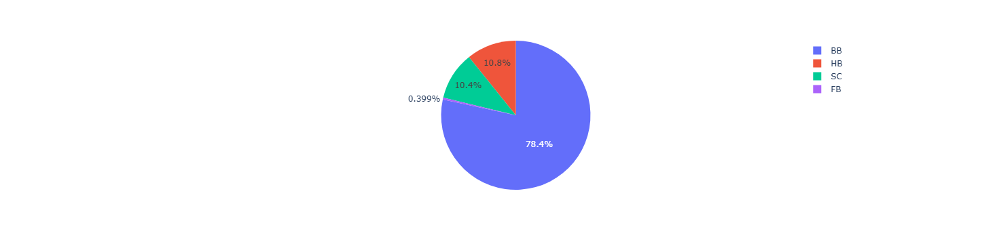

In [61]:
fig = px.pie(hotels, names='meal')
fig.show()

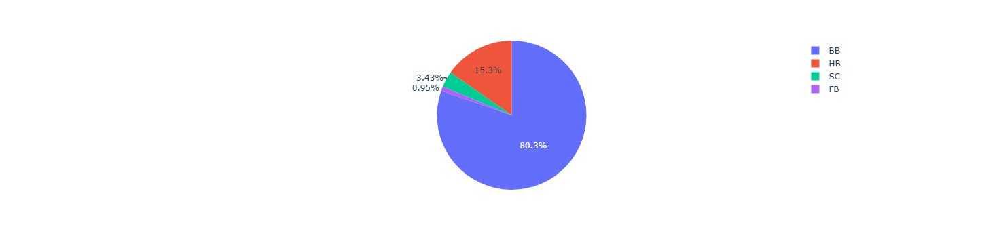

In [62]:
fig = px.pie(hotels[hotels.children==1], names='meal')
fig.show()

**Country**

In [63]:
hotels.country.value_counts().head(10)

country
PRT    12082
GBR     5770
FRA     4864
ESP     3719
DEU     3020
IRL     1577
ITA     1371
BEL     1148
NLD     1040
USA      969
Name: count, dtype: int64

In [64]:
hotels.country.value_counts(normalize=True)

country
PRT    0.280338
GBR    0.133881
FRA    0.112859
ESP    0.086292
DEU    0.070073
         ...   
CYM    0.000023
PAN    0.000023
MDG    0.000023
LAO    0.000023
ATA    0.000023
Name: proportion, Length: 154, dtype: float64

In [65]:
count_country = hotels.groupby(['country']).hotel.count().sort_values(ascending=False).reset_index().head(20)
count_country

,country,hotel
0,PRT,12082
1,GBR,5770
2,FRA,4864
3,ESP,3719
4,DEU,3020
5,IRL,1577
6,ITA,1371
7,BEL,1148
8,NLD,1040
9,USA,969


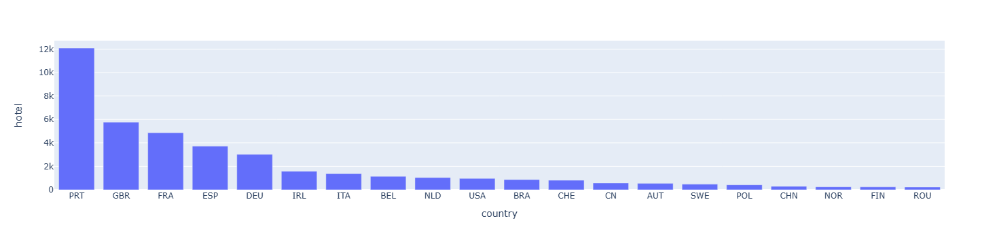

In [66]:
fig = px.bar(count_country, x='country', y='hotel')
fig.show()

In [67]:
top_20_countries_list = count_country.country.to_list()

In [68]:
top_20_countries = hotels[hotels.country.isin(top_20_countries_list)].groupby(['country', 'children']).hotel.count().reset_index().sort_values(by='hotel', ascending=False)

In [69]:
top_20_countries

,country,children,hotel
32,PRT,0,10936
20,GBR,0,5365
18,FRA,0,4420
14,ESP,0,3255
12,DEU,0,2838
22,IRL,0,1479
24,ITA,0,1230
33,PRT,1,1146
2,BEL,0,1046
26,NLD,0,954


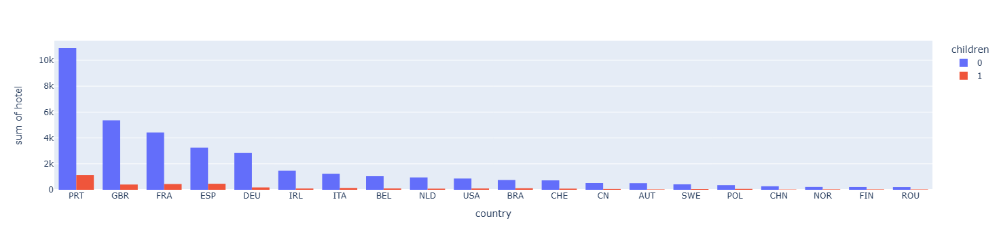

In [70]:
fig = px.histogram(top_20_countries, x='country', y='hotel', color='children', barmode='group')
fig.show()

**Market segment**

In [71]:
hotels.head()

,hotel,lead_time,stays_in_weekend_nights,stays_in_week_nights,adults,children,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,days_in_waiting_list,customer_type,average_daily_rate,required_car_parking_spaces,total_of_special_requests,arrival_date,year_month,month
0,City_Hotel,217,1,3,2,0,BB,DEU,Offline_TA/TO,TA/TO,0,0,0,A,A,0,No_Deposit,0,Transient-Party,80.75,0,1,2016-09-01,2016-09,9
1,City_Hotel,2,0,1,2,0,BB,PRT,Direct,Direct,0,0,0,D,K,0,No_Deposit,0,Transient,170.00,0,3,2017-08-25,2017-08,8
2,Resort_Hotel,95,2,5,2,0,BB,GBR,Online_TA,TA/TO,0,0,0,A,A,2,No_Deposit,0,Transient,8.00,0,2,2016-11-19,2016-11,11
3,Resort_Hotel,143,2,6,2,0,HB,ROU,Online_TA,TA/TO,0,0,0,A,A,0,No_Deposit,0,Transient,81.00,0,1,2016-04-26,2016-04,4
4,Resort_Hotel,136,1,4,2,0,HB,PRT,Direct,Direct,0,0,0,F,F,0,No_Deposit,0,Transient,157.60,0,4,2016-12-28,2016-12,12


In [72]:
hotels.market_segment.value_counts()

market_segment
Online_TA        22616
Offline_TA/TO     8223
Direct            6819
Groups            2686
Corporate         2506
Complementary      414
Aviation           121
Name: count, dtype: int64

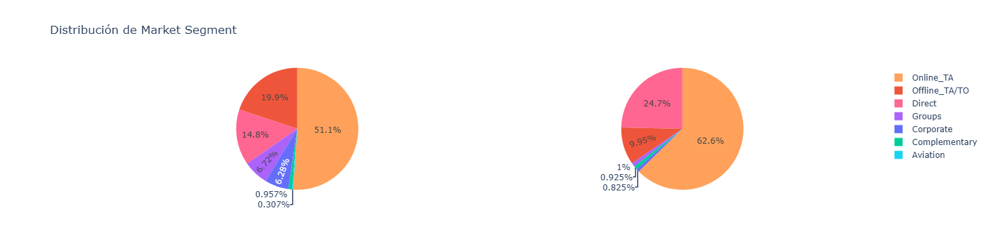

In [73]:
# Filtramos los datos según la cantidad de niños
data_children_0 = hotels[hotels['children'] == 0]['market_segment'].value_counts()
data_children_1 = hotels[hotels['children'] == 1]['market_segment'].value_counts()

# Obtener los mismos segmentos para ambos gráficos y asignarles colores constantes
unique_segments = list(set(data_children_0.index).union(set(data_children_1.index)))
colors = px.colors.qualitative.Plotly[:len(unique_segments)]  # Usamos colores de Plotly

# Diccionario para mantener el color de cada segmento constante
color_map = {segment: colors[i] for i, segment in enumerate(unique_segments)}

# Gráfico para children == 0
fig = go.Figure()
fig.add_trace(go.Pie(
    labels=data_children_0.index,
    values=data_children_0.values,
    name="Children = 0",
    marker=dict(colors=[color_map[segment] for segment in data_children_0.index])
))

# Gráfico para children == 1
fig.add_trace(go.Pie(
    labels=data_children_1.index,
    values=data_children_1.values,
    name="Children = 1",
    marker=dict(colors=[color_map[segment] for segment in data_children_1.index]),
    domain=dict(x=[0.5, 1])  # Ubicamos el gráfico al lado derecho
))

# Configuración de layout
fig.update_layout(
    title="Distribución de Market Segment",
    # annotations=[
    #     dict(text="Children = 0", x=0.18, y=0.5, font_size=15, showarrow=False),
    #     dict(text="Children = 1", x=0.82, y=0.5, font_size=15, showarrow=False)
    # ],
    grid=dict(columns=2, rows=1)
)

# Mostrar gráfico
fig.show()

**Distribution channel**

In [74]:
hotels.distribution_channel.value_counts()

distribution_channel
TA/TO        32714
Direct        7533
Corporate     3035
GDS            102
Undefined        1
Name: count, dtype: int64

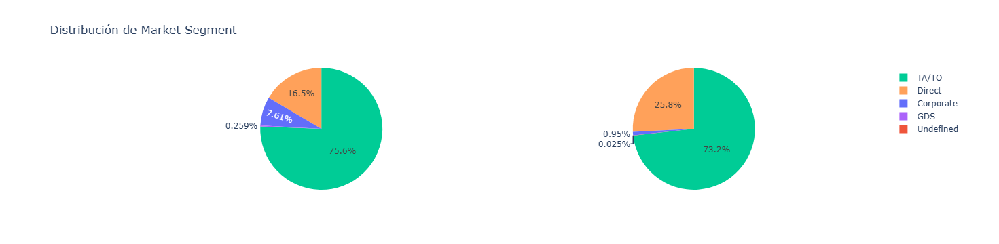

In [75]:
# Filtramos los datos según la cantidad de niños
data_children_0 = hotels[hotels['children'] == 0]['distribution_channel'].value_counts()
data_children_1 = hotels[hotels['children'] == 1]['distribution_channel'].value_counts()

# Obtener los mismos segmentos para ambos gráficos y asignarles colores constantes
unique_segments = list(set(data_children_0.index).union(set(data_children_1.index)))
colors = px.colors.qualitative.Plotly[:len(unique_segments)]  # Usamos colores de Plotly

# Diccionario para mantener el color de cada segmento constante
color_map = {segment: colors[i] for i, segment in enumerate(unique_segments)}

# Gráfico para children == 0
fig = go.Figure()
fig.add_trace(go.Pie(
    labels=data_children_0.index,
    values=data_children_0.values,
    name="Children = 0",
    marker=dict(colors=[color_map[segment] for segment in data_children_0.index])
))

# Gráfico para children == 1
fig.add_trace(go.Pie(
    labels=data_children_1.index,
    values=data_children_1.values,
    name="Children = 1",
    marker=dict(colors=[color_map[segment] for segment in data_children_1.index]),
    domain=dict(x=[0.5, 1])  # Ubicamos el gráfico al lado derecho
))

# Configuración de layout
fig.update_layout(
    title="Distribución de Market Segment",
    # annotations=[
    #     dict(text="Children = 0", x=0.18, y=0.5, font_size=15, showarrow=False),
    #     dict(text="Children = 1", x=0.82, y=0.5, font_size=15, showarrow=False)
    # ],
    grid=dict(columns=2, rows=1)
)

# Mostrar gráfico
fig.show()

**Repeated guest**

In [76]:
hotels.is_repeated_guest.value_counts()

is_repeated_guest
0    41281
1     2104
Name: count, dtype: int64

In [77]:
hotels.groupby(['children']).is_repeated_guest.value_counts(normalize=True)

children  is_repeated_guest
0         0                    0.948129
          1                    0.051871
1         0                    0.984746
          1                    0.015254
Name: proportion, dtype: float64

**Previous cancellations**

In [78]:
hotels.previous_cancellations.value_counts()

previous_cancellations
0     43005
1       245
2        52
3        25
11       20
4        15
5        13
6         9
13        1
Name: count, dtype: int64

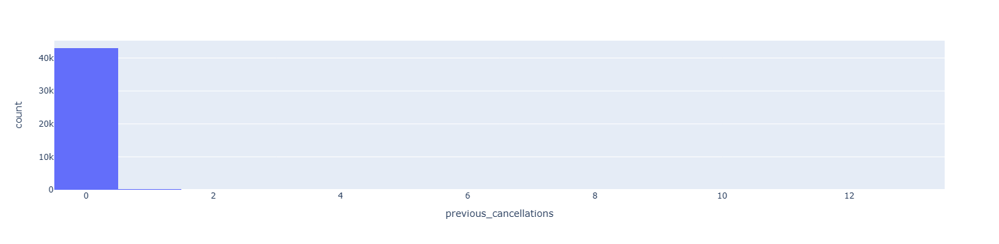

In [79]:
fig = px.histogram(hotels, x="previous_cancellations")
fig.show()

**Previous booking not cancelled**

In [80]:
hotels.previous_bookings_not_canceled.value_counts().head()

previous_bookings_not_canceled
0    41141
1      935
2      370
3      210
4      148
Name: count, dtype: int64

**Reserved Room type**

In [81]:
hotels.reserved_room_type.value_counts()

reserved_room_type
A    28911
D     8215
E     2975
F     1278
G      893
B      461
C      416
H      234
L        2
Name: count, dtype: int64

In [82]:
reserv_room_type_pctg = hotels.groupby(['children']).reserved_room_type.value_counts(normalize=True).reset_index()
reserv_room_type_pctg

,children,reserved_room_type,proportion
0,0,A,0.695958
1,0,D,0.196897
2,0,E,0.068806
3,0,F,0.016757
4,0,G,0.008531
5,0,B,0.008277
6,0,C,0.003148
7,0,H,0.001574
8,0,L,0.000051
9,1,A,0.375094


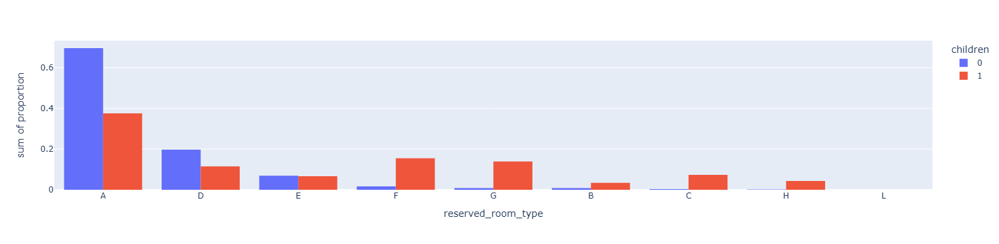

In [83]:
fig = px.histogram(reserv_room_type_pctg, x='reserved_room_type', y='proportion', color='children', barmode='group')
fig.show()

**Assigned Room type**

In [84]:
hotels.assigned_room_type.value_counts()

assigned_room_type
A    22196
D    11565
E     3734
F     1799
C     1223
G     1173
B      965
H      312
I      237
K      181
Name: count, dtype: int64

In [85]:
assigned_room_type_pctg = hotels.groupby(['children']).assigned_room_type.value_counts(normalize=True).reset_index()
assigned_room_type_pctg

,children,assigned_room_type,proportion
0,0,A,0.539151
1,0,D,0.274006
2,0,E,0.087112
3,0,F,0.029808
4,0,C,0.021632
5,0,B,0.020794
6,0,G,0.014320
7,0,I,0.005433
8,0,K,0.004342
9,0,H,0.003402


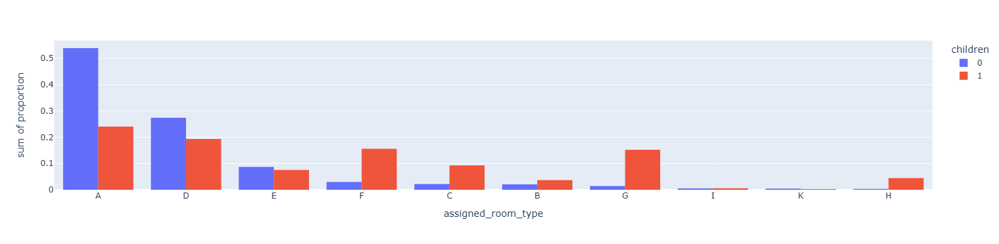

In [86]:
fig = px.histogram(assigned_room_type_pctg, x='assigned_room_type', y='proportion', color='children', barmode='group')
fig.show()

**Booking changes**

In [87]:
hotels.booking_changes.value_counts()

booking_changes
0     34181
1      6448
2      1899
3       507
4       203
5        70
6        29
7        13
8        11
9         6
10        4
13        3
15        3
17        2
11        2
18        1
16        1
21        1
12        1
Name: count, dtype: int64

**Days in waiting list**

In [88]:
hotels.days_in_waiting_list.value_counts()

days_in_waiting_list
0      42957
63        31
87        22
58        20
122       16
       ...  
7          1
23         1
35         1
36         1
72         1
Name: count, Length: 92, dtype: int64

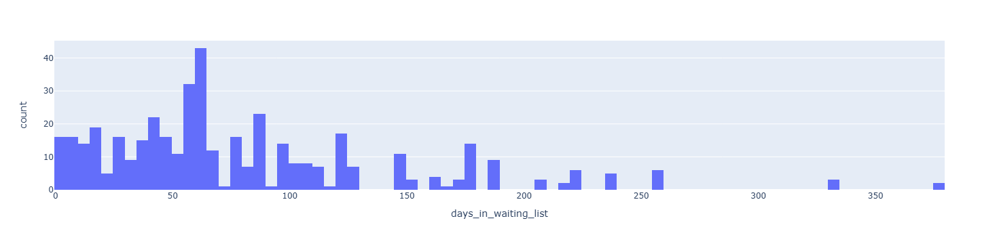

In [89]:
fig = px.histogram(hotels[hotels.days_in_waiting_list >0], x="days_in_waiting_list", nbins=100)
fig.show()

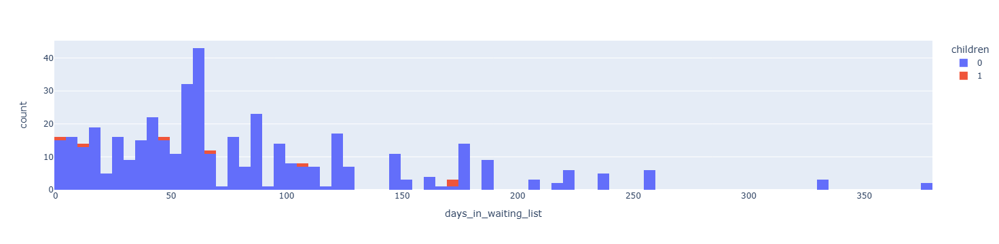

In [90]:
fig = px.histogram(hotels[hotels.days_in_waiting_list >0], x="days_in_waiting_list", color='children', nbins=100)
fig.show()

**average daily rate**

In [91]:
hotels.head()

,hotel,lead_time,stays_in_weekend_nights,stays_in_week_nights,adults,children,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,days_in_waiting_list,customer_type,average_daily_rate,required_car_parking_spaces,total_of_special_requests,arrival_date,year_month,month
0,City_Hotel,217,1,3,2,0,BB,DEU,Offline_TA/TO,TA/TO,0,0,0,A,A,0,No_Deposit,0,Transient-Party,80.75,0,1,2016-09-01,2016-09,9
1,City_Hotel,2,0,1,2,0,BB,PRT,Direct,Direct,0,0,0,D,K,0,No_Deposit,0,Transient,170.00,0,3,2017-08-25,2017-08,8
2,Resort_Hotel,95,2,5,2,0,BB,GBR,Online_TA,TA/TO,0,0,0,A,A,2,No_Deposit,0,Transient,8.00,0,2,2016-11-19,2016-11,11
3,Resort_Hotel,143,2,6,2,0,HB,ROU,Online_TA,TA/TO,0,0,0,A,A,0,No_Deposit,0,Transient,81.00,0,1,2016-04-26,2016-04,4
4,Resort_Hotel,136,1,4,2,0,HB,PRT,Direct,Direct,0,0,0,F,F,0,No_Deposit,0,Transient,157.60,0,4,2016-12-28,2016-12,12


In [92]:
hotels.average_daily_rate.describe()

count    43385.000000
mean       101.591314
std         50.947817
min         -6.380000
25%         67.780000
50%         94.500000
75%        128.780000
max        510.000000
Name: average_daily_rate, dtype: float64

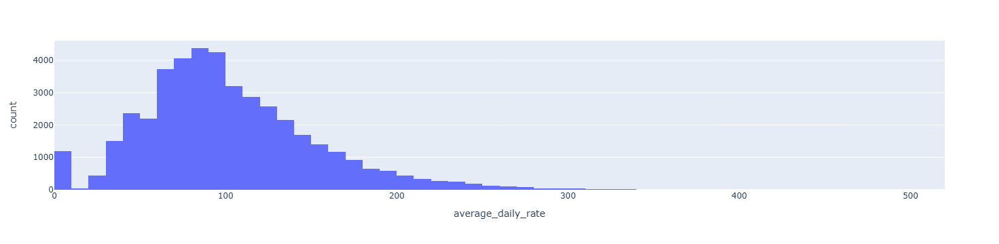

In [93]:
fig = px.histogram(hotels[hotels.average_daily_rate>=0], x="average_daily_rate", nbins=100)
fig.show()

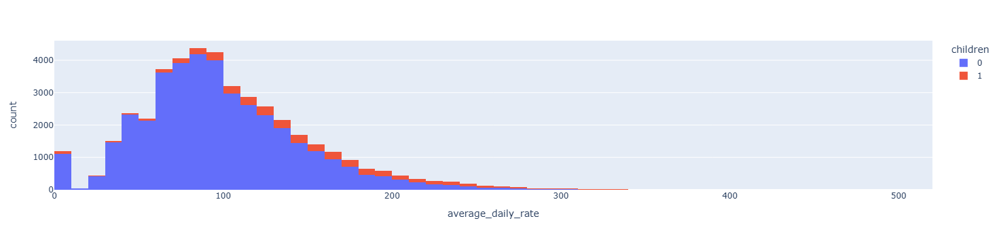

In [94]:
fig = px.histogram(hotels[hotels.average_daily_rate>=0], x="average_daily_rate", color='children', nbins=100)
fig.show()

In [95]:
costo_mes = hotels[hotels.average_daily_rate>=0].groupby(['year_month', 'hotel']).average_daily_rate.mean().reset_index()

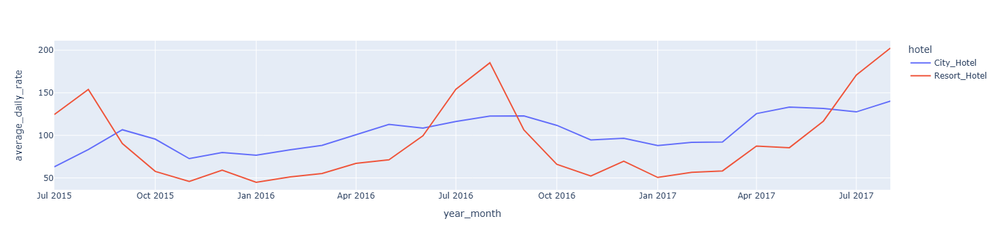

In [96]:
fig = px.line(costo_mes, x="year_month", y='average_daily_rate', color ='hotel')
fig.show()

As a general rule, the Average Daily Rate (ADR) tends to be higher at the City Hotel and more stable. However, during the summer and holiday seasons, the ADR for the Resort Hotel noticeably begins to rise. November and January (winter) have the cheapest ADR in the Resort Hotel 

**Arrival date**

In [97]:
arrival_date = hotels.groupby(['arrival_date', 'children']).hotel.count().reset_index()
arrival_date

,arrival_date,children,hotel
0,2015-07-01,0,27
1,2015-07-01,1,1
2,2015-07-02,0,23
3,2015-07-03,0,19
4,2015-07-03,1,2
...,...,...,...
1510,2017-08-29,1,7
1511,2017-08-30,0,37
1512,2017-08-30,1,4
1513,2017-08-31,0,49


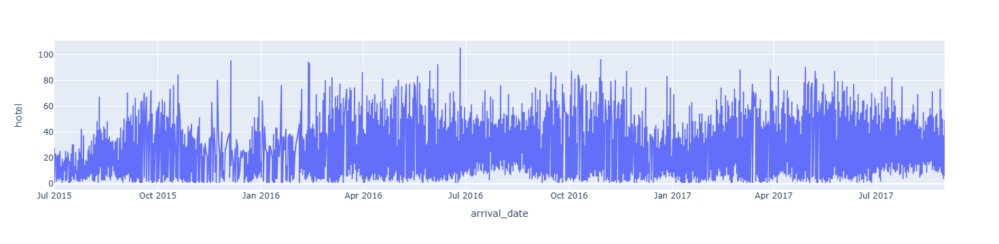

In [98]:
fig = px.line(arrival_date, x="arrival_date", y='hotel')
fig.show()

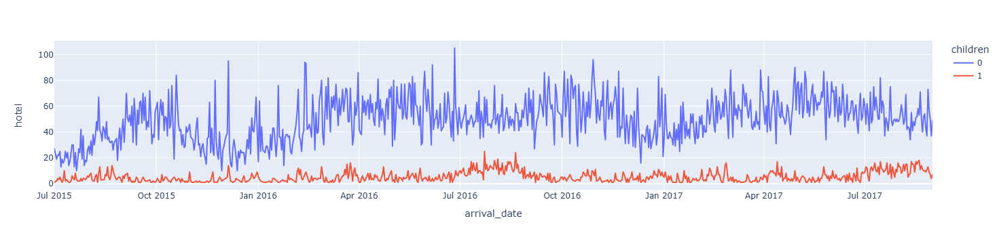

In [99]:
fig = px.line(arrival_date, x="arrival_date", y='hotel', color ='children')
fig.show()

In [100]:
hotels.head()

,hotel,lead_time,stays_in_weekend_nights,stays_in_week_nights,adults,children,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,days_in_waiting_list,customer_type,average_daily_rate,required_car_parking_spaces,total_of_special_requests,arrival_date,year_month,month
0,City_Hotel,217,1,3,2,0,BB,DEU,Offline_TA/TO,TA/TO,0,0,0,A,A,0,No_Deposit,0,Transient-Party,80.75,0,1,2016-09-01,2016-09,9
1,City_Hotel,2,0,1,2,0,BB,PRT,Direct,Direct,0,0,0,D,K,0,No_Deposit,0,Transient,170.00,0,3,2017-08-25,2017-08,8
2,Resort_Hotel,95,2,5,2,0,BB,GBR,Online_TA,TA/TO,0,0,0,A,A,2,No_Deposit,0,Transient,8.00,0,2,2016-11-19,2016-11,11
3,Resort_Hotel,143,2,6,2,0,HB,ROU,Online_TA,TA/TO,0,0,0,A,A,0,No_Deposit,0,Transient,81.00,0,1,2016-04-26,2016-04,4
4,Resort_Hotel,136,1,4,2,0,HB,PRT,Direct,Direct,0,0,0,F,F,0,No_Deposit,0,Transient,157.60,0,4,2016-12-28,2016-12,12


In [101]:
arrival_year_month = hotels.groupby(['year_month', 'children']).hotel.count().reset_index()
arrival_year_month.head()

,year_month,children,hotel
0,2015-07,0,676
1,2015-07,1,98
2,2015-08,0,1106
3,2015-08,1,171
4,2015-09,0,1521


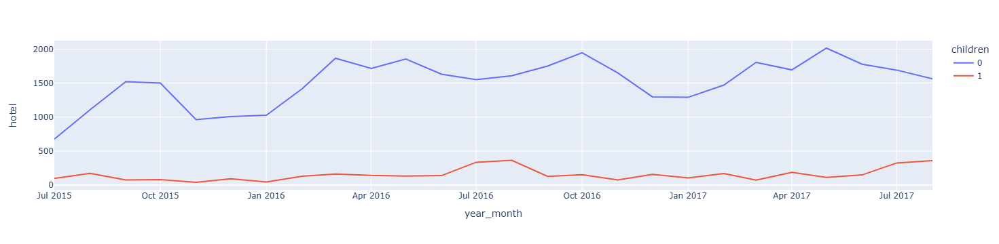

In [102]:
fig = px.line(arrival_year_month, x="year_month", y='hotel', color='children')
fig.show()

In [103]:
arrival_month = hotels.groupby(['month', 'children']).hotel.count().reset_index()
arrival_month.head()

,month,children,hotel
0,1,0,2317
1,1,1,150
2,2,0,2885
3,2,1,300
4,3,0,3670


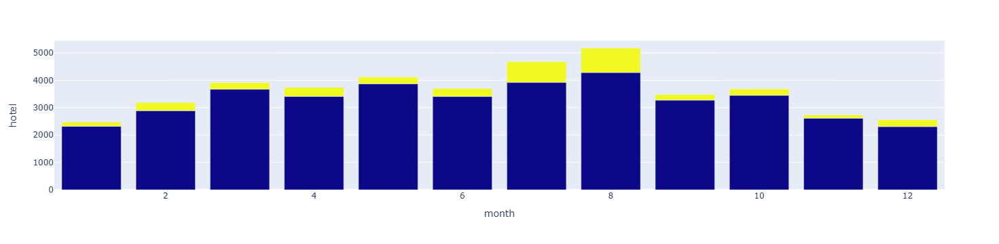

In [104]:
fig = px.bar(arrival_month, x="month", y="hotel", color="children")
fig.update_coloraxes(showscale=False)  # Oculta la barra de colores
fig.show()

De esta columna nos vamos a quedar solo con el mes, para no caer en el overfitting (no tiene sentido utilizar las fechas en este caso pero el mes quizás sí, porque hay estacionalidad)

## Feature engineering

### Country:
* Null values (less than 1%)
* Too many unique categorical values (154 countries) --> High dimensionallity if we create dummys!
* Solution:
    * Group countries with less than 2% reservations in a category named "Others"
    * Replace null values with "Others"

In [105]:
# Calculate % of reservations by country
country_counts = hotels['country'].value_counts(normalize=True) * 100
country_counts

country
PRT    28.033783
GBR    13.388092
FRA    11.285907
ESP     8.629171
DEU     7.007286
         ...    
CYM     0.002320
PAN     0.002320
MDG     0.002320
LAO     0.002320
ATA     0.002320
Name: proportion, Length: 154, dtype: float64

In [106]:
# Select
countries_to_keep = country_counts[country_counts >= 2].index.tolist()
countries_to_keep

['PRT', 'GBR', 'FRA', 'ESP', 'DEU', 'IRL', 'ITA', 'BEL', 'NLD', 'USA', 'BRA']

In [107]:
# Replace countries under 2% by "Others"
hotels['country'] = hotels['country'].apply(lambda x: x if x in countries_to_keep else 'Others')

# Replace null values by "Others"
hotels['country'].fillna('Others', inplace=True)

/tmp/ipykernel_78/3230459255.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_78/3230459255.py:5: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.



/tmp/ipykernel_78/3230459255.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

In [108]:
hotels

,hotel,lead_time,stays_in_weekend_nights,stays_in_week_nights,adults,children,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,days_in_waiting_list,customer_type,average_daily_rate,required_car_parking_spaces,total_of_special_requests,arrival_date,year_month,month
0,City_Hotel,217,1,3,2,0,BB,DEU,Offline_TA/TO,TA/TO,0,0,0,A,A,0,No_Deposit,0,Transient-Party,80.75,0,1,2016-09-01,2016-09,9
1,City_Hotel,2,0,1,2,0,BB,PRT,Direct,Direct,0,0,0,D,K,0,No_Deposit,0,Transient,170.00,0,3,2017-08-25,2017-08,8
2,Resort_Hotel,95,2,5,2,0,BB,GBR,Online_TA,TA/TO,0,0,0,A,A,2,No_Deposit,0,Transient,8.00,0,2,2016-11-19,2016-11,11
3,Resort_Hotel,143,2,6,2,0,HB,Others,Online_TA,TA/TO,0,0,0,A,A,0,No_Deposit,0,Transient,81.00,0,1,2016-04-26,2016-04,4
4,Resort_Hotel,136,1,4,2,0,HB,PRT,Direct,Direct,0,0,0,F,F,0,No_Deposit,0,Transient,157.60,0,4,2016-12-28,2016-12,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49995,Resort_Hotel,172,0,2,2,1,BB,PRT,Direct,Direct,0,0,0,A,A,1,No_Deposit,0,Transient,73.39,0,1,2016-10-07,2016-10,10
49996,Resort_Hotel,48,0,4,2,0,FB,PRT,Direct,Direct,0,0,0,A,B,2,No_Deposit,0,Transient,158.00,0,0,2015-09-01,2015-09,9
49997,City_Hotel,155,0,4,2,0,BB,DEU,Offline_TA/TO,TA/TO,0,0,0,A,A,0,No_Deposit,0,Transient,82.50,0,1,2017-07-26,2017-07,7
49998,Resort_Hotel,140,2,5,2,0,HB,GBR,Direct,Direct,0,0,0,G,G,0,No_Deposit,0,Transient,143.00,0,0,2016-04-28,2016-04,4


### Correlation analysis

In [109]:
categorical_cols = ['hotel', 'meal', 'country', 'market_segment', 'distribution_channel', 'reserved_room_type',
                   'assigned_room_type', 'deposit_type','customer_type']

In [110]:
numerical_cols = ["lead_time", "stays_in_weekend_nights", "stays_in_week_nights", "total_nights", "adults", "is_repeated_guest","previous_cancellations",
        "previous_bookings_not_canceled", "booking_changes", "days_in_waiting_list", "average_daily_rate", "required_car_parking_spaces", "total_of_special_requests", "month"
    ]

In [111]:
for col in categorical_cols:
    hotels[col] = hotels[col].astype(str)
    hotels[col] = LabelEncoder().fit_transform(hotels[col])

/tmp/ipykernel_78/811569218.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_78/811569218.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_78/811569218.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_78/811569218.

In [112]:
hotels

,hotel,lead_time,stays_in_weekend_nights,stays_in_week_nights,adults,children,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,days_in_waiting_list,customer_type,average_daily_rate,required_car_parking_spaces,total_of_special_requests,arrival_date,year_month,month
0,0,217,1,3,2,0,0,2,5,3,0,0,0,0,0,0,0,0,3,80.75,0,1,2016-09-01,2016-09,9
1,0,2,0,1,2,0,0,10,3,1,0,0,0,3,9,0,0,0,2,170.00,0,3,2017-08-25,2017-08,8
2,1,95,2,5,2,0,0,5,6,3,0,0,0,0,0,2,0,0,2,8.00,0,2,2016-11-19,2016-11,11
3,1,143,2,6,2,0,2,9,6,3,0,0,0,0,0,0,0,0,2,81.00,0,1,2016-04-26,2016-04,4
4,1,136,1,4,2,0,2,10,3,1,0,0,0,5,5,0,0,0,2,157.60,0,4,2016-12-28,2016-12,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49995,1,172,0,2,2,1,0,10,3,1,0,0,0,0,0,1,0,0,2,73.39,0,1,2016-10-07,2016-10,10
49996,1,48,0,4,2,0,1,10,3,1,0,0,0,0,1,2,0,0,2,158.00,0,0,2015-09-01,2015-09,9
49997,0,155,0,4,2,0,0,2,5,3,0,0,0,0,0,0,0,0,2,82.50,0,1,2017-07-26,2017-07,7
49998,1,140,2,5,2,0,2,5,3,1,0,0,0,6,6,0,0,0,2,143.00,0,0,2016-04-28,2016-04,4


In [113]:
hotels_corr = hotels.drop(columns=['arrival_date', 'year_month'])

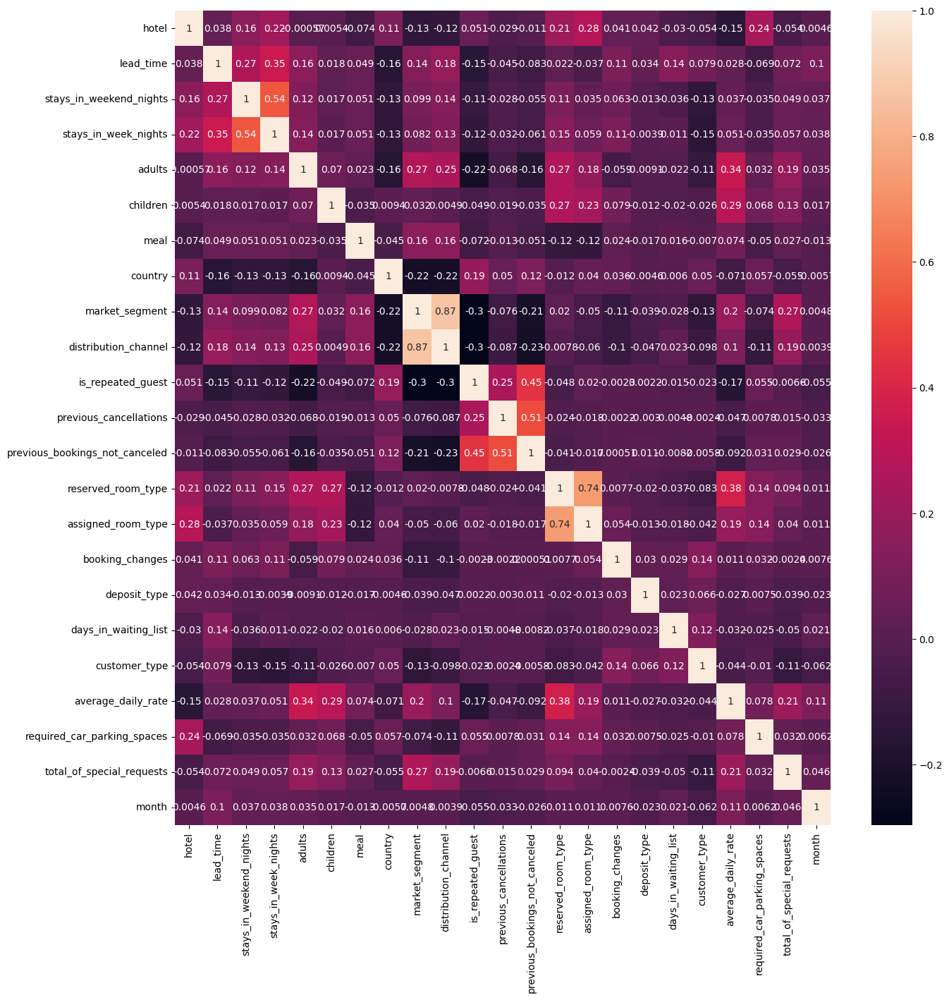

In [114]:
hotels_corr = hotels_corr.corr(method='pearson')
plt.figure(figsize=(15, 15))
seaborn.heatmap(hotels_corr, annot=True)
plt.show()

In [115]:
hotels_corr.children.sort_values(ascending=False) 

children                          1.000000
average_daily_rate                0.292948
reserved_room_type                0.270460
assigned_room_type                0.232358
total_of_special_requests         0.131651
booking_changes                   0.079059
adults                            0.069615
required_car_parking_spaces       0.068273
market_segment                    0.032396
lead_time                         0.018120
stays_in_weekend_nights           0.017371
month                             0.017216
stays_in_week_nights              0.016584
country                           0.009444
hotel                             0.005366
distribution_channel              0.004928
deposit_type                     -0.012222
previous_cancellations           -0.019361
days_in_waiting_list             -0.020224
customer_type                    -0.025835
previous_bookings_not_canceled   -0.034743
meal                             -0.034810
is_repeated_guest                -0.049310
Name: child

# Preprocessing

In [116]:
pipeline = Pipeline(
        [
            # Transformers applied to raw data
            ("filter_duplicated_rows", RemoveDuplicatesTransformer()),
            ("filter_data", FilterDataTransformer()),
            ("convert_to_binary_columns", BoolDataTransformer()),
            ("convert_to_date", DateColsTransformer()),
            ("create_target", TargetTransformer()),
            ("country_column", CountryTransformer()),
            ("total_nights", TotalNightsTransformer()),
        ]
    )

In [117]:
hotels_preprocessing = pipeline.transform(hotels_raw)

/mnt/c/Users/IgnacioVillagra/Documents/fligoo-fligoo-labs-a7c4fff04690/fligoo-fligoo-labs-a7c4fff04690/data_scientist/semi_senior/transformers.py:81: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.





In [118]:
hotels_preprocessing

,hotel,lead_time,stays_in_weekend_nights,stays_in_week_nights,adults,target,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,days_in_waiting_list,customer_type,average_daily_rate,required_car_parking_spaces,total_of_special_requests,month,total_nights
0,City_Hotel,217,1,3,2,0,BB,DEU,Offline_TA/TO,TA/TO,0,0,0,A,A,0,No_Deposit,0,Transient-Party,80.75,0,1,9,4
1,City_Hotel,2,0,1,2,0,BB,PRT,Direct,Direct,0,0,0,D,K,0,No_Deposit,0,Transient,170.00,0,3,8,1
2,Resort_Hotel,95,2,5,2,0,BB,GBR,Online_TA,TA/TO,0,0,0,A,A,2,No_Deposit,0,Transient,8.00,0,2,11,7
3,Resort_Hotel,143,2,6,2,0,HB,Others,Online_TA,TA/TO,0,0,0,A,A,0,No_Deposit,0,Transient,81.00,0,1,4,8
4,Resort_Hotel,136,1,4,2,0,HB,PRT,Direct,Direct,0,0,0,F,F,0,No_Deposit,0,Transient,157.60,0,4,12,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49995,Resort_Hotel,172,0,2,2,1,BB,PRT,Direct,Direct,0,0,0,A,A,1,No_Deposit,0,Transient,73.39,0,1,10,2
49996,Resort_Hotel,48,0,4,2,0,FB,PRT,Direct,Direct,0,0,0,A,B,2,No_Deposit,0,Transient,158.00,0,0,9,4
49997,City_Hotel,155,0,4,2,0,BB,DEU,Offline_TA/TO,TA/TO,0,0,0,A,A,0,No_Deposit,0,Transient,82.50,0,1,7,4
49998,Resort_Hotel,140,2,5,2,0,HB,GBR,Direct,Direct,0,0,0,G,G,0,No_Deposit,0,Transient,143.00,0,0,4,7


# Processing

In [119]:
hotels_preprocessing.shape

(43194, 24)

In [120]:
hotels_preprocessing = hotels_preprocessing.reset_index(drop=True)
hotels_preprocessing

,hotel,lead_time,stays_in_weekend_nights,stays_in_week_nights,adults,target,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,days_in_waiting_list,customer_type,average_daily_rate,required_car_parking_spaces,total_of_special_requests,month,total_nights
0,City_Hotel,217,1,3,2,0,BB,DEU,Offline_TA/TO,TA/TO,0,0,0,A,A,0,No_Deposit,0,Transient-Party,80.75,0,1,9,4
1,City_Hotel,2,0,1,2,0,BB,PRT,Direct,Direct,0,0,0,D,K,0,No_Deposit,0,Transient,170.00,0,3,8,1
2,Resort_Hotel,95,2,5,2,0,BB,GBR,Online_TA,TA/TO,0,0,0,A,A,2,No_Deposit,0,Transient,8.00,0,2,11,7
3,Resort_Hotel,143,2,6,2,0,HB,Others,Online_TA,TA/TO,0,0,0,A,A,0,No_Deposit,0,Transient,81.00,0,1,4,8
4,Resort_Hotel,136,1,4,2,0,HB,PRT,Direct,Direct,0,0,0,F,F,0,No_Deposit,0,Transient,157.60,0,4,12,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
43189,Resort_Hotel,172,0,2,2,1,BB,PRT,Direct,Direct,0,0,0,A,A,1,No_Deposit,0,Transient,73.39,0,1,10,2
43190,Resort_Hotel,48,0,4,2,0,FB,PRT,Direct,Direct,0,0,0,A,B,2,No_Deposit,0,Transient,158.00,0,0,9,4
43191,City_Hotel,155,0,4,2,0,BB,DEU,Offline_TA/TO,TA/TO,0,0,0,A,A,0,No_Deposit,0,Transient,82.50,0,1,7,4
43192,Resort_Hotel,140,2,5,2,0,HB,GBR,Direct,Direct,0,0,0,G,G,0,No_Deposit,0,Transient,143.00,0,0,4,7


In [122]:
hotels_preprocessing.target.value_counts(normalize=True)

target
0    0.909455
1    0.090545
Name: proportion, dtype: float64

In [123]:
class CustomOneHotEncoder(OneHotEncoder):
    """Custom OneHotEncoder."""

    def transform(self, X):
        """Transform, return array."""
        # Transform the data using the parent method
        transformed = super().transform(X)

        # Return a common array
        return transformed.toarray()

In [124]:
FEATURES_GROUPS = {
    "features_to_transform_categorical": ['hotel', 'meal', 'country', 'market_segment', 'distribution_channel', 'reserved_room_type',
                   'assigned_room_type', 'deposit_type','customer_type'],
    "features_to_transform_numerical": [
        "lead_time",
        "stays_in_weekend_nights",
        "stays_in_week_nights",
        "total_nights",
        "adults",
        "is_repeated_guest",
        "previous_cancellations",
        "previous_bookings_not_canceled",
        "booking_changes",
        "days_in_waiting_list",
        "average_daily_rate",
        "required_car_parking_spaces",
        "total_of_special_requests",
        "month"
    ],
    "features_to_keep": [],
}

In [125]:
transform_cols_num = FEATURES_GROUPS["features_to_transform_numerical"]
transform_cols_cat = FEATURES_GROUPS["features_to_transform_categorical"]
remainder_cols = FEATURES_GROUPS["features_to_keep"]

In [126]:
categorical_transformer = Pipeline(
            steps=[
                ("imputer", SimpleImputer(strategy="most_frequent")),
                ("onehot", CustomOneHotEncoder(handle_unknown="ignore")),
            ]
        )

In [127]:
numerical_transformer = Pipeline(
            steps=[
                ("imputer", SimpleImputer(strategy="median")),
                ("scaler", StandardScaler()),
            ]
        )

In [128]:
preprocessor = ColumnTransformer(
    transformers=[
        ("num", numerical_transformer, transform_cols_num),
        ('cat', categorical_transformer, transform_cols_cat)
    ],
    verbose_feature_names_out=False,
)

In [129]:
hotels_processing = preprocessor.fit_transform(hotels_preprocessing)

In [130]:
hotels_processing = pd.DataFrame(hotels_processing, columns=preprocessor.get_feature_names_out())

In [131]:
hotels_processing

,lead_time,stays_in_weekend_nights,stays_in_week_nights,total_nights,adults,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,booking_changes,days_in_waiting_list,average_daily_rate,required_car_parking_spaces,total_of_special_requests,month,hotel_City_Hotel,hotel_Resort_Hotel,meal_BB,meal_FB,meal_HB,meal_SC,meal_Undefined,country_BEL,country_BRA,country_DEU,country_ESP,country_FRA,country_GBR,country_IRL,country_ITA,country_NLD,country_Others,country_PRT,country_USA,market_segment_Aviation,market_segment_Complementary,market_segment_Corporate,market_segment_Direct,market_segment_Groups,market_segment_Offline_TA/TO,market_segment_Online_TA,distribution_channel_Corporate,distribution_channel_Direct,distribution_channel_GDS,distribution_channel_TA/TO,distribution_channel_Undefined,reserved_room_type_A,reserved_room_type_B,reserved_room_type_C,reserved_room_type_D,reserved_room_type_E,reserved_room_type_F,reserved_room_type_G,reserved_room_type_H,reserved_room_type_L,assigned_room_type_A,assigned_room_type_B,assigned_room_type_C,assigned_room_type_D,assigned_room_type_E,assigned_room_type_F,assigned_room_type_G,assigned_room_type_H,assigned_room_type_I,assigned_room_type_K,deposit_type_No_Deposit,deposit_type_Non_Refund,deposit_type_Refundable,customer_type_Contract,customer_type_Group,customer_type_Transient,customer_type_Transient-Party
0,1.763247,0.036340,0.244064,0.195523,0.299429,-0.224299,-0.06233,-0.120613,-0.409379,-0.077391,-0.415582,-0.358534,0.290122,0.799078,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0
1,-0.839494,-0.955879,-0.762966,-0.929581,0.299429,-0.224299,-0.06233,-0.120613,-0.409379,-0.077391,1.341530,-0.358534,2.647892,0.482246,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
2,0.286343,1.028560,1.251093,1.320626,0.299429,-0.224299,-0.06233,-0.120613,2.239122,-0.077391,-1.847849,-0.358534,1.469007,1.432743,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
3,0.867420,1.028560,1.754607,1.695661,0.299429,-0.224299,-0.06233,-0.120613,-0.409379,-0.077391,-0.410660,-0.358534,0.290122,-0.785083,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
4,0.782679,0.036340,0.747578,0.570557,0.299429,-0.224299,-0.06233,-0.120613,-0.409379,-0.077391,1.097404,-0.358534,3.826777,1.749575,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
43189,1.218487,-0.955879,-0.259451,-0.554546,0.299429,-0.224299,-0.06233,-0.120613,0.914872,-0.077391,-0.560482,-0.358534,0.290122,1.115910,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
43190,-0.282629,-0.955879,0.747578,0.195523,0.299429,-0.224299,-0.06233,-0.120613,2.239122,-0.077391,1.105279,-0.358534,-0.888763,0.799078,0.0,1.0,0.0,1

In [135]:
hotels_processing_merge = pd.concat([hotels_processing, hotels_preprocessing.target], axis=1)

In [136]:
# correlation_matrix = hotels_processing_merge.corr()

In [137]:
# correlation_matrix.target.sort_values()

# Train Test Split

In [138]:
X = hotels_processing_merge.drop(columns=['target'])

In [139]:
y = hotels_processing_merge.target

In [140]:
# Hay que utilizar el parámetro "stratify" porque el dataset está muy desbalanceado y de este modo nos aseguramos que se mantenga la proporción de target=1 tanto en el entrenamiento como en test
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.8, random_state = 8, stratify=y)

In [141]:
X_train

,lead_time,stays_in_weekend_nights,stays_in_week_nights,total_nights,adults,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,booking_changes,days_in_waiting_list,average_daily_rate,required_car_parking_spaces,total_of_special_requests,month,hotel_City_Hotel,hotel_Resort_Hotel,meal_BB,meal_FB,meal_HB,meal_SC,meal_Undefined,country_BEL,country_BRA,country_DEU,country_ESP,country_FRA,country_GBR,country_IRL,country_ITA,country_NLD,country_Others,country_PRT,country_USA,market_segment_Aviation,market_segment_Complementary,market_segment_Corporate,market_segment_Direct,market_segment_Groups,market_segment_Offline_TA/TO,market_segment_Online_TA,distribution_channel_Corporate,distribution_channel_Direct,distribution_channel_GDS,distribution_channel_TA/TO,distribution_channel_Undefined,reserved_room_type_A,reserved_room_type_B,reserved_room_type_C,reserved_room_type_D,reserved_room_type_E,reserved_room_type_F,reserved_room_type_G,reserved_room_type_H,reserved_room_type_L,assigned_room_type_A,assigned_room_type_B,assigned_room_type_C,assigned_room_type_D,assigned_room_type_E,assigned_room_type_F,assigned_room_type_G,assigned_room_type_H,assigned_room_type_I,assigned_room_type_K,deposit_type_No_Deposit,deposit_type_Non_Refund,deposit_type_Refundable,customer_type_Contract,customer_type_Group,customer_type_Transient,customer_type_Transient-Party
18536,-0.754754,0.036340,-0.259451,-0.179512,0.299429,-0.224299,-0.06233,-0.120613,2.239122,-0.077391,1.341530,-0.358534,2.647892,-0.151418,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
39936,-0.645802,0.036340,-0.762966,-0.554546,-1.693106,-0.224299,-0.06233,-0.120613,-0.409379,-0.077391,-0.312222,-0.358534,0.290122,-1.418747,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
26560,1.412180,0.036340,-0.259451,-0.179512,-1.693106,-0.224299,-0.06233,-0.120613,-0.409379,-0.077391,-0.215753,-0.358534,0.290122,0.165414,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
3469,-0.851600,0.036340,-0.762966,-0.554546,-1.693106,-0.224299,-0.06233,-0.120613,-0.409379,-0.077391,0.435904,-0.358534,0.290122,0.482246,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
42014,1.387968,-0.955879,0.244064,-0.179512,0.299429,-0.224299,-0.06233,-0.120613,-0.409379,-0.077391,-0.238197,-0.358534,-0.888763,0.482246,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41262,-0.524744,-0.955879,0.244064,-0.179512,-1.693106,-0.224299,-0.06233,-0.120613,0.914872,-0.077391,0.563873,-0.358534,-0.888763,-0.151418,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
20068,2.077997,1.028560,0.244064,0.570557,0.299429,-0.224299,-0.06233,-0.120613,0.914872,-0.077391,-0.920566,-0.35853

In [142]:
y_train

18536    0
39936    0
26560    0
3469     0
42014    0
        ..
41262    0
20068    0
38449    0
39287    0
9058     0
Name: target, Length: 34555, dtype: int64

In [171]:
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((34555, 71), (8639, 71), (34555,), (8639,))

In [143]:
hotels_processing_merge.target.value_counts(normalize=True)

target
0    0.909455
1    0.090545
Name: proportion, dtype: float64

In [144]:
y_train.value_counts(normalize=True)

target
0    0.909449
1    0.090551
Name: proportion, dtype: float64

In [145]:
y_test.value_counts(normalize=True)

target
0    0.90948
1    0.09052
Name: proportion, dtype: float64

# Part II - Modeling

We will build the best model to predict which actual hotel stays included children/babies, and which did not:

## LightGBM

In [146]:
model_lgbm = lgb.LGBMClassifier(random_state=0)
# model_lgbm.get_params()

In [147]:
model_lgbm_fit = model_lgbm.fit(X_train, y_train)

[LightGBM] [Info] Number of positive: 3129, number of negative: 31426
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.007063 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 837
[LightGBM] [Info] Number of data points in the train set: 34555, number of used features: 69
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.090551 -> initscore=-2.306922
[LightGBM] [Info] Start training from score -2.306922


In [148]:
# params = {
#     'objective': 'binary',
#     'metric': 'binary_logloss',
#     'boosting_type': 'gbdt',
#     'num_leaves': 31,
#     'learning_rate': 0.05,
#     'feature_fraction': 0.9
# }

### Evaluation in Training set

In [149]:
train_predictions_lgbm = model_lgbm_fit.predict(X_train)
accuracy_train_lgbm = accuracy_score(y_train, train_predictions_lgbm)
print(f"Accuracy train: %.2f%%" % (accuracy_train_lgbm * 100.0))

Accuracy train: 95.04%


In [150]:
print(classification_report(y_train, train_predictions_lgbm))

              precision    recall  f1-score   support

           0       0.95      0.99      0.97     31426
           1       0.87      0.53      0.66      3129

    accuracy                           0.95     34555
   macro avg       0.91      0.76      0.82     34555
weighted avg       0.95      0.95      0.94     34555



In [151]:
confusion_matrix(y_train, train_predictions_lgbm)

array([[31188,   238],
       [ 1475,  1654]])

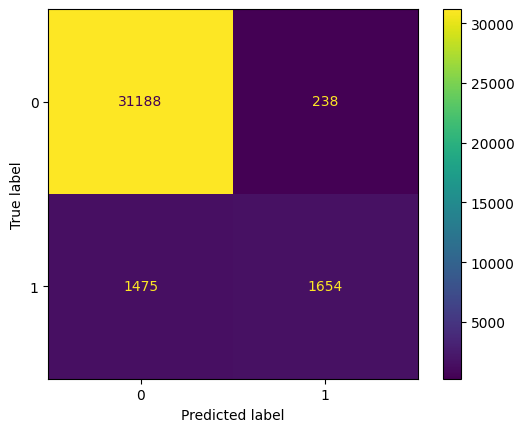

In [152]:
ConfusionMatrixDisplay.from_predictions(y_train, train_predictions_lgbm)
plt.show()

### Evaluation in Test set

In [153]:
X_test.shape, y_test.shape

((8639, 71), (8639,))

In [154]:
test_predictions_lgbm = model_lgbm_fit.predict(X_test)
accuracy_test_lgbm = accuracy_score(y_test, test_predictions_lgbm)
print(f"Accuracy train: %.2f%%" % (accuracy_test_lgbm * 100.0))

Accuracy train: 94.02%


In [155]:
print(classification_report(y_test, test_predictions_lgbm))

              precision    recall  f1-score   support

           0       0.95      0.99      0.97      7857
           1       0.79      0.46      0.58       782

    accuracy                           0.94      8639
   macro avg       0.87      0.73      0.78      8639
weighted avg       0.93      0.94      0.93      8639



In [156]:
confusion_matrix(y_test, test_predictions_lgbm)

array([[7760,   97],
       [ 420,  362]])

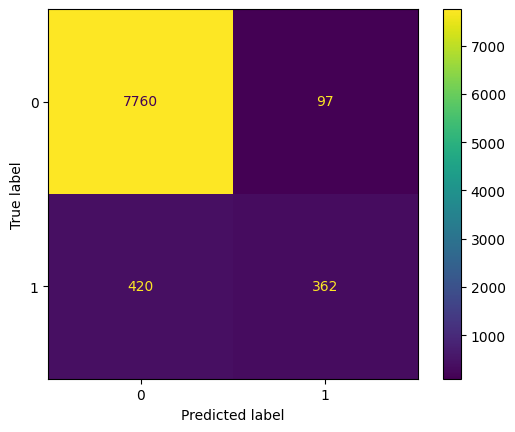

In [157]:
ConfusionMatrixDisplay.from_predictions(y_test, test_predictions_lgbm)
plt.show()

### Predictions

In [158]:
y_pred_binary = model_lgbm_fit.predict(X_test)

In [159]:
len(y_pred_binary)

8639

In [160]:
#
# Develop Machine/Statistical Learning models to predict the target variable...
#

### Grid Search

In [161]:
param_grid = {
    'learning_rate': [0.01, 0.05, 0.1],
    'num_leaves': [31, 50, 100],
    'max_depth': [-1, 10, 20],
    'objective': ['binary', 'multiclass'],
    #'metric': 'binary_logloss',
    #'boosting_type': 'gbdt'
}

print(f'Combinaciones posibles: {len(ParameterGrid(param_grid))}')

Combinaciones posibles: 54


In [65]:
# params = {
#     'objective': 'binary',
#     'metric': 'binary_logloss',
#     'boosting_type': 'gbdt',
#     'num_leaves': 31,
#     'learning_rate': 0.05,
#     'feature_fraction': 0.9
# }

In [162]:
grid_search = GridSearchCV(
    estimator=model_lgbm,
    param_grid=param_grid,
    cv=5,  # Número de folds en la validación cruzada
    scoring='accuracy',  # Métrica para evaluar
    n_jobs=-1,  # Usar todos los núcleos disponibles
    verbose=1  # Mostrar el progreso
)

In [163]:
grid_search.fit(X_train, y_train)

Fitting 5 folds for each of 54 candidates, totalling 270 fits


[LightGBM] [Fatal] Number of classes should be specified and greater than 1 for multiclass training
[LightGBM] [Fatal] Number of classes should be specified and greater than 1 for multiclass training
[LightGBM] [Fatal] Number of classes should be specified and greater than 1 for multiclass training
[LightGBM] [Fatal] Number of classes should be specified and greater than 1 for multiclass training
[LightGBM] [Fatal] Number of classes should be specified and greater than 1 for multiclass training
[LightGBM] [Fatal] Number of classes should be specified and greater than 1 for multiclass training
[LightGBM] [Fatal] Number of classes should be specified and greater than 1 for multiclass training
[LightGBM] [Fatal] Number of classes should be specified and greater than 1 for multiclass training
[LightGBM] [Fatal] Number of classes should be specified and greater than 1 for multiclass training
[LightGBM] [Fatal] Number of classes should be specified and greater than 1 for multiclass training


[LightGBM] [Info] Number of positive: 2503, number of negative: 25141
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.447708 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 825
[LightGBM] [Info] Number of data points in the train set: 27644, number of used features: 69
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.090544 -> initscore=-2.307010
[LightGBM] [Info] Start training from score -2.307010
[LightGBM] [Info] Number of positive: 2503, number of negative: 25141
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002569 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 826
[LightGBM] [Info] Number of data points in the train set: 27644, number of used features: 69
[LightGBM] [Info] [bin

[LightGBM] [Fatal] Number of classes should be specified and greater than 1 for multiclass training


92 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 822
[LightGBM] [Info] Number of data points in the train set: 27644, number of used features: 69
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.090544 -> initscore=-2.307010
[LightGBM] [Info] Start training from score -2.307010
[LightGBM] [Info] Number of positive: 2504, number of negative: 25140
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.262086 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 824
[LightGBM] [Info] Number of data points in the train set: 27644, number of used features: 69
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.090580 -> initscore=-2.306571
[LightGBM] [Info] Start training from score -2.306571
[LightGBM] [Warning] Accuracy may be bad since you

[LightGBM] [Fatal] Number of classes should be specified and greater than 1 for multiclass training
[LightGBM] [Fatal] Number of classes should be specified and greater than 1 for multiclass training
[LightGBM] [Fatal] Number of classes should be specified and greater than 1 for multiclass training
[LightGBM] [Fatal] Number of classes should be specified and greater than 1 for multiclass training
[LightGBM] [Fatal] Number of classes should be specified and greater than 1 for multiclass training
[LightGBM] [Fatal] Number of classes should be specified and greater than 1 for multiclass training
[LightGBM] [Fatal] Number of classes should be specified and greater than 1 for multiclass training
[LightGBM] [Fatal] Number of classes should be specified and greater than 1 for multiclass training
[LightGBM] [Fatal] Number of classes should be specified and greater than 1 for multiclass training
[LightGBM] [Fatal] Number of classes should be specified and greater than 1 for multiclass training


[LightGBM] [Info] Number of positive: 2503, number of negative: 25141
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 1.300176 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 826
[LightGBM] [Info] Number of data points in the train set: 27644, number of used features: 69
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.090544 -> initscore=-2.307010
[LightGBM] [Info] Start training from score -2.307010
[LightGBM] [Info] Number of positive: 2503, number of negative: 25141
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.099662 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 822
[LightGBM] [Info] Number of data points in the train set: 27644, number of used features: 69
[LightGBM] [Info] [bin

[LightGBM] [Fatal] Number of classes should be specified and greater than 1 for multiclass training
[LightGBM] [Fatal] Number of classes should be specified and greater than 1 for multiclass training
[LightGBM] [Fatal] Number of classes should be specified and greater than 1 for multiclass training
[LightGBM] [Fatal] Number of classes should be specified and greater than 1 for multiclass training
[LightGBM] [Fatal] Number of classes should be specified and greater than 1 for multiclass training


[LightGBM] [Info] Number of positive: 2503, number of negative: 25141
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.580562 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 822
[LightGBM] [Info] Number of data points in the train set: 27644, number of used features: 69
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.090544 -> initscore=-2.307010
[LightGBM] [Info] Start training from score -2.307010
[LightGBM] [Info] Number of positive: 2503, number of negative: 25141
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.732345 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 824
[LightGBM] [Info] Number of data points in the train set: 27644, number of used features: 69
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.090544 -> initscore=-2.307010
[Light

[LightGBM] [Fatal] Number of classes should be specified and greater than 1 for multiclass training


] Total Bins 824
[LightGBM] [Info] Number of data points in the train set: 27644, number of used features: 69
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.090544 -> initscore=-2.307010
[LightGBM] [Info] Number of positive: 2503, number of negative: 25141
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.623250 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 824
[LightGBM] [Info] Number of data points in the train set: 27644, number of used features: 69
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.090544 -> initscore=-2.307010
[LightGBM] [Info] Start training from score -2.307010
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves

[LightGBM] [Fatal] Number of classes should be specified and greater than 1 for multiclass training
[LightGBM] [Fatal] Number of classes should be specified and greater than 1 for multiclass training
[LightGBM] [Fatal] Number of classes should be specified and greater than 1 for multiclass training
[LightGBM] [Fatal] Number of classes should be specified and greater than 1 for multiclass training
[LightGBM] [Fatal] Number of classes should be specified and greater than 1 for multiclass training
[LightGBM] [Fatal] Number of classes should be specified and greater than 1 for multiclass training
[LightGBM] [Fatal] Number of classes should be specified and greater than 1 for multiclass training
[LightGBM] [Fatal] Number of classes should be specified and greater than 1 for multiclass training
[LightGBM] [Fatal] Number of classes should be specified and greater than 1 for multiclass training


[LightGBM] [Info] Number of positive: 2504, number of negative: 25140
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.252148 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 824
[LightGBM] [Info] Number of data points in the train set: 27644, number of used features: 69
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.090580 -> initscore=-2.306571
[LightGBM] [Info] Start training from score -2.306571
[LightGBM] [Info] Number of positive: 2503, number of negative: 25141
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002391 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 825
[LightGBM] [Info] Number of data points in the train set: 27644, number of used features: 69
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.090544 -> initscore=-2.307010
[Light

[LightGBM] [Fatal] Number of classes should be specified and greater than 1 for multiclass training


Info] Number of data points in the train set: 27644, number of used features: 69
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.090544 -> initscore=-2.307010


[LightGBM] [Fatal] Number of classes should be specified and greater than 1 for multiclass training
[LightGBM] [Fatal] Number of classes should be specified and greater than 1 for multiclass training
[LightGBM] [Fatal] Number of classes should be specified and greater than 1 for multiclass training


[LightGBM] [Info] Number of positive: 2503, number of negative: 25141
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.239293 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 824
[LightGBM] [Info] Number of data points in the train set: 27644, number of used features: 69
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.090544 -> initscore=-2.307010
[LightGBM] [Info] Start training from score -2.307010
[LightGBM] [Info] Number of positive: 2504, number of negative: 25140
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.326132 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 824
[LightGBM] [Info] Number of data points in the train set: 27644, number of used features: 69
[LightGBM] [Info] [bin

[LightGBM] [Fatal] Number of classes should be specified and greater than 1 for multiclass training


used features: 69
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.090544 -> initscore=-2.307010
[LightGBM] [Info] Start training from score -2.307010
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 2503, number of negative: 25141
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002717 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 824
[LightGBM] [Info] Number of data points in the train set: 27644, number of used features: 69
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.090544 -> initscore=-2.307010
[LightGBM] [Info] Start training from score -2.307010
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [

[LightGBM] [Fatal] Number of classes should be specified and greater than 1 for multiclass training
[LightGBM] [Fatal] Number of classes should be specified and greater than 1 for multiclass training
[LightGBM] [Fatal] Number of classes should be specified and greater than 1 for multiclass training
[LightGBM] [Fatal] Number of classes should be specified and greater than 1 for multiclass training
[LightGBM] [Fatal] Number of classes should be specified and greater than 1 for multiclass training
[LightGBM] [Fatal] Number of classes should be specified and greater than 1 for multiclass training
[LightGBM] [Fatal] Number of classes should be specified and greater than 1 for multiclass training
[LightGBM] [Fatal] Number of classes should be specified and greater than 1 for multiclass training
[LightGBM] [Fatal] Number of classes should be specified and greater than 1 for multiclass training
[LightGBM] [Fatal] Number of classes should be specified and greater than 1 for multiclass training


[LightGBM] [Info] Number of positive: 2504, number of negative: 25140
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.471207 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 824
[LightGBM] [Info] Number of data points in the train set: 27644, number of used features: 69
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.090580 -> initscore=-2.306571
[LightGBM] [Info] Start training from score -2.306571
[LightGBM] [Info] Number of positive: 2503, number of negative: 25141
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.529029 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 826
[LightGBM] [Info] Number of data points in the train set: 27644, number of used features: 69
[LightGBM] [Info] [bin

[LightGBM] [Fatal] Number of classes should be specified and greater than 1 for multiclass training
[LightGBM] [Fatal] Number of classes should be specified and greater than 1 for multiclass training
[LightGBM] [Fatal] Number of classes should be specified and greater than 1 for multiclass training
[LightGBM] [Fatal] Number of classes should be specified and greater than 1 for multiclass training
[LightGBM] [Fatal] Number of classes should be specified and greater than 1 for multiclass training
[LightGBM] [Fatal] Number of classes should be specified and greater than 1 for multiclass training
[LightGBM] [Fatal] Number of classes should be specified and greater than 1 for multiclass training
[LightGBM] [Fatal] Number of classes should be specified and greater than 1 for multiclass training
[LightGBM] [Fatal] Number of classes should be specified and greater than 1 for multiclass training
[LightGBM] [Fatal] Number of classes should be specified and greater than 1 for multiclass training


[LightGBM] [Info] Number of positive: 3129, number of negative: 31426
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004171 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 837
[LightGBM] [Info] Number of data points in the train set: 34555, number of used features: 69
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.090551 -> initscore=-2.306922
[LightGBM] [Info] Start training from score -2.306922


GridSearchCV(cv=5, estimator=LGBMClassifier(random_state=0), n_jobs=-1,
             param_grid={'learning_rate': [0.01, 0.05, 0.1],
                         'max_depth': [-1, 10, 20], 'num_leaves': [31, 50, 100],
                         'objective': ['binary', 'multiclass']},
             scoring='accuracy', verbose=1)

In [164]:
grid_search.best_params_

{'learning_rate': 0.05,
 'max_depth': 20,
 'num_leaves': 100,
 'objective': 'binary'}

In [165]:
best_model = grid_search.best_estimator_
best_model

LGBMClassifier(learning_rate=0.05, max_depth=20, num_leaves=100,
               objective='binary', random_state=0)

In [166]:
train_predictions_lgbm_2 = best_model.predict(X_train)
accuracy_train_lgbm_2 = accuracy_score(y_train, train_predictions_lgbm_2)
print(f"Accuracy train: %.2f%%" % (accuracy_train_lgbm_2 * 100.0))

Accuracy train: 95.84%


In [167]:
print(classification_report(y_train, train_predictions_lgbm_2))

              precision    recall  f1-score   support

           0       0.96      0.99      0.98     31426
           1       0.91      0.60      0.72      3129

    accuracy                           0.96     34555
   macro avg       0.94      0.80      0.85     34555
weighted avg       0.96      0.96      0.95     34555



In [168]:
test_predictions_lgbm_2 = best_model.predict(X_test)
accuracy_test_lgbm_2 = accuracy_score(y_test, test_predictions_lgbm_2)
print(f"Accuracy train: %.2f%%" % (accuracy_test_lgbm_2 * 100.0))

Accuracy train: 94.05%


In [169]:
print(classification_report(y_test, test_predictions_lgbm_2))

              precision    recall  f1-score   support

           0       0.95      0.99      0.97      7857
           1       0.78      0.48      0.59       782

    accuracy                           0.94      8639
   macro avg       0.86      0.73      0.78      8639
weighted avg       0.93      0.94      0.93      8639



## SMOTE for inbalanced datasets

SMOTE (synthetic minority oversampling technique) is one of the most commonly used oversampling methods to solve the imbalance problem. It aims to balance class distribution by randomly increasing minority class examples by replicating them. SMOTE synthesises new minority instances between existing minority instances.

In [170]:
sm = SMOTE(random_state = 2)

[LightGBM] [Info] Start training from score -2.307010
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 2503, number of negative: 25141
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.179713 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 826
[LightGBM] [Info] Number of data points in the train set: 27644, number of used features: 69
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.090544 -> initscore=-2.307010
[LightGBM] [Info] Start training from score -2.307010
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further spl

In [172]:
X_train_smote, y_train_smote = sm.fit_resample(X_train, y_train)

In [199]:
X_train.shape,  y_train.shape

((34555, 71), (34555,))

In [173]:
X_train_smote.shape,  y_train_smote.shape

((62852, 71), (62852,))

In [186]:
y_train_smote.value_counts()

target
0    31426
1    31426
Name: count, dtype: int64

### LightGBM

In [174]:
model_lgbm = lgb.LGBMClassifier(random_state=0)
# model_lgbm.get_params()

In [176]:
model_lgbm_fit_smote = model_lgbm.fit(X_train_smote, y_train_smote)

[LightGBM] [Info] Number of positive: 31426, number of negative: 31426
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008734 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 13943
[LightGBM] [Info] Number of data points in the train set: 62852, number of used features: 69
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000


### Evaluation in Training set

In [177]:
train_predictions_lgbm_smote = model_lgbm_fit_smote.predict(X_train)
accuracy_train_lgbm_smote = accuracy_score(y_train, train_predictions_lgbm_smote)
print(f"Accuracy train: %.2f%%" % (accuracy_train_lgbm_smote * 100.0))

Accuracy train: 94.49%


In [178]:
print(classification_report(y_train, train_predictions_lgbm_smote))

              precision    recall  f1-score   support

           0       0.96      0.99      0.97     31426
           1       0.79      0.54      0.64      3129

    accuracy                           0.94     34555
   macro avg       0.87      0.76      0.80     34555
weighted avg       0.94      0.94      0.94     34555



### Evaluation in Test set

In [179]:
test_predictions_lgbm_smote = model_lgbm_fit_smote.predict(X_test)
accuracy_test_lgbm_smote = accuracy_score(y_test, test_predictions_lgbm_smote)
print(f"Accuracy train: %.2f%%" % (accuracy_test_lgbm_smote * 100.0))

Accuracy train: 93.83%


In [180]:
print(classification_report(y_test, test_predictions_lgbm_smote))

              precision    recall  f1-score   support

           0       0.95      0.98      0.97      7857
           1       0.74      0.49      0.59       782

    accuracy                           0.94      8639
   macro avg       0.84      0.74      0.78      8639
weighted avg       0.93      0.94      0.93      8639



## NearMiss -Undersampling

NearMiss is an under-sampling technique. It aims to balance class distribution by randomly eliminating majority class examples. When instances of two different classes are very close to each other, we remove the instances of the majority class to increase the spaces between the two classes.

In [191]:
near_miss  = NearMiss(version=1)

In [192]:
X_train_nm, y_train_nm = near_miss .fit_resample(X_train, y_train)

In [193]:
X_train_nm.shape,  y_train_nm.shape

((6258, 71), (6258,))

In [194]:
y_train_nm.value_counts()

target
0    3129
1    3129
Name: count, dtype: int64

### LightGBM

In [211]:
model_lgbm = lgb.LGBMClassifier(random_state=0)
# model_lgbm.get_params()

In [212]:
model_lgbm_fit_nm = model_lgbm.fit(X_train_nm, y_train_nm)

[LightGBM] [Info] Number of positive: 3129, number of negative: 3129
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000730 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 690
[LightGBM] [Info] Number of data points in the train set: 6258, number of used features: 60
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000


### Evaluation in Training set

In [213]:
train_predictions_lgbm_nm = model_lgbm_fit_nm.predict(X_train)
accuracy_train_lgbm_nm = accuracy_score(y_train, train_predictions_lgbm_nm)
print(f"Accuracy train: %.2f%%" % (accuracy_train_lgbm_nm * 100.0))

Accuracy train: 43.61%


In [215]:
print(classification_report(y_train, train_predictions_lgbm_nm))

              precision    recall  f1-score   support

           0       0.98      0.39      0.56     31426
           1       0.13      0.93      0.23      3129

    accuracy                           0.44     34555
   macro avg       0.56      0.66      0.39     34555
weighted avg       0.90      0.44      0.53     34555



### Evaluation in Test set

In [216]:
test_predictions_lgbm_nm = model_lgbm_fit_nm.predict(X_test)
accuracy_test_lgbm_nm = accuracy_score(y_test, test_predictions_lgbm_nm)
print(f"Accuracy train: %.2f%%" % (accuracy_test_lgbm_nm * 100.0))

Accuracy train: 44.80%


In [217]:
print(classification_report(y_test, test_predictions_lgbm_nm))

              precision    recall  f1-score   support

           0       0.97      0.41      0.57      7857
           1       0.13      0.88      0.22       782

    accuracy                           0.45      8639
   macro avg       0.55      0.64      0.40      8639
weighted avg       0.89      0.45      0.54      8639



## Otra opción de ajuste del modelo

In [218]:
model = lgb.LGBMClassifier(random_state= 45, scale_pos_weight=(len(y) - sum(y)) / sum(y))
# model_lgbm.get_params()

In [222]:
model_lgbm_fit = model.fit(X_train, y_train)

[LightGBM] [Info] Number of positive: 3129, number of negative: 31426
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005581 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 837
[LightGBM] [Info] Number of data points in the train set: 34555, number of used features: 69
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.090551 -> initscore=-2.306922
[LightGBM] [Info] Start training from score -2.306922


### Evaluation in Training set

In [223]:
train_predictions_lgbm = model_lgbm_fit.predict(X_train)
accuracy_train_lgbm = accuracy_score(y_train, train_predictions_lgbm)
print(f"Accuracy train: %.2f%%" % (accuracy_train_lgbm * 100.0))

Accuracy train: 88.51%


In [224]:
print(classification_report(y_train, train_predictions_lgbm))

              precision    recall  f1-score   support

           0       0.99      0.88      0.93     31426
           1       0.44      0.90      0.59      3129

    accuracy                           0.89     34555
   macro avg       0.71      0.89      0.76     34555
weighted avg       0.94      0.89      0.90     34555



### Evaluation in Test set

In [225]:
test_predictions_lgbm = model_lgbm_fit.predict(X_test)
accuracy_test_lgbm = accuracy_score(y_test, test_predictions_lgbm)
print(f"Accuracy train: %.2f%%" % (accuracy_test_lgbm * 100.0))

Accuracy train: 86.25%


In [226]:
print(classification_report(y_test, test_predictions_lgbm))

              precision    recall  f1-score   support

           0       0.98      0.87      0.92      7857
           1       0.38      0.79      0.51       782

    accuracy                           0.86      8639
   macro avg       0.68      0.83      0.71      8639
weighted avg       0.92      0.86      0.88      8639



## XGBoost

In [230]:
model_xgb = XGBClassifier(objective='binary:logistic', random_state=45)
# model_lgbm.get_params()

In [125]:
model_xgb_fit = model_xgb.fit(x_train, y_train)

In [55]:
# params = {
#     'objective': 'binary',
#     'metric': 'binary_logloss',
#     'boosting_type': 'gbdt',
#     'num_leaves': 31,
#     'learning_rate': 0.05,
#     'feature_fraction': 0.9
# }

### Evaluation in Training set

In [126]:
train_predictions_xgb = model_xgb_fit.predict(x_train)
accuracy_train_xgb = accuracy_score(y_train, train_predictions_xgb)
print(f"Accuracy train: %.2f%%" % (accuracy_train_xgb * 100.0))

Accuracy train: 96.06%


In [127]:
print(classification_report(y_train, train_predictions_xgb))

              precision    recall  f1-score   support

           0       0.96      1.00      0.98     31428
           1       0.93      0.61      0.74      3127

    accuracy                           0.96     34555
   macro avg       0.95      0.80      0.86     34555
weighted avg       0.96      0.96      0.96     34555



In [128]:
confusion_matrix(y_train, train_predictions_xgb)

array([[31283,   145],
       [ 1216,  1911]])

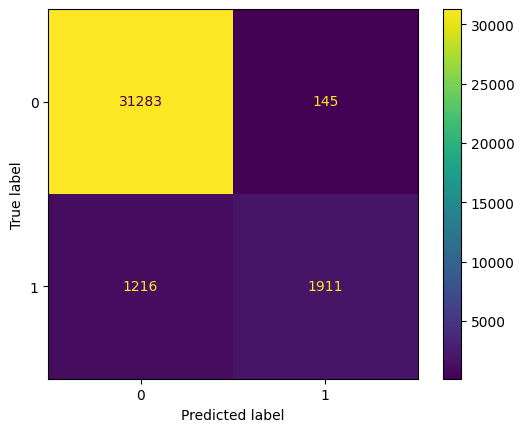

In [129]:
ConfusionMatrixDisplay.from_predictions(y_train, train_predictions_xgb)
plt.show()

### Evaluation in Test set

In [130]:
x_test.shape, y_test.shape

((8639, 213), (8639,))

In [131]:
test_predictions_xgb = model_xgb_fit.predict(x_test)
accuracy_test_xgb = accuracy_score(y_test, test_predictions_xgb)
print(f"Accuracy train: %.2f%%" % (accuracy_test_xgb * 100.0))

Accuracy train: 94.41%


In [132]:
print(classification_report(y_test, test_predictions_xgb))

              precision    recall  f1-score   support

           0       0.95      0.99      0.97      7855
           1       0.80      0.51      0.62       784

    accuracy                           0.94      8639
   macro avg       0.88      0.75      0.80      8639
weighted avg       0.94      0.94      0.94      8639



In [133]:
confusion_matrix(y_test, test_predictions_xgb)

array([[7756,   99],
       [ 384,  400]])

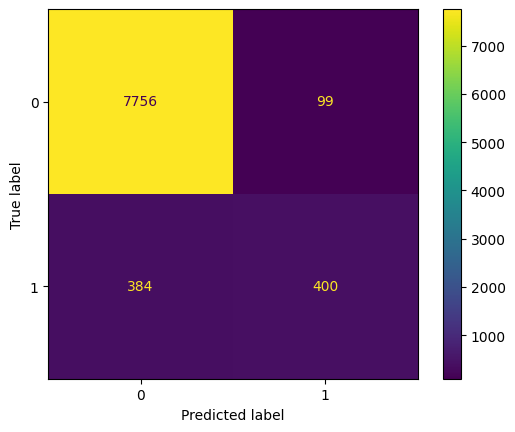

In [134]:
ConfusionMatrixDisplay.from_predictions(y_test, test_predictions_xgb)
plt.show()

### Grid Search

In [232]:
param_grid_xgb = {
    'max_depth': [3, 4, 5],
    'learning_rate': [0.1, 0.01, 0.001],
    'n_estimators': [100, 200, 300],
    'subsample': [0.7,0.8, 0.9],
    'colsample_bytree': [0.9, 1.0,1.2]
}

print(f'Combinaciones posibles: {len(ParameterGrid(param_grid_xgb))}')

Combinaciones posibles: 243


In [233]:
grid_search = GridSearchCV(
    estimator=model_xgb,
    param_grid=param_grid_xgb,
    cv=5,  # Número de folds en la validación cruzada
    scoring='accuracy',  # Métrica para evaluar
    n_jobs=-1,  # Usar todos los núcleos disponibles
    verbose=1  # Mostrar el progreso
)

In [237]:
grid_search.fit(X_train, y_train)

Fitting 5 folds for each of 243 candidates, totalling 1215 fits


/home/ivillagra/miniconda3/lib/python3.11/site-packages/sklearn/model_selection/_validation.py:547: FitFailedWarning:


405 fits failed out of a total of 1215.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
405 fits failed with the following error:
Traceback (most recent call last):
  File "/home/ivillagra/miniconda3/lib/python3.11/site-packages/sklearn/model_selection/_validation.py", line 895, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/home/ivillagra/miniconda3/lib/python3.11/site-packages/xgboost/core.py", line 726, in inner_f
    return func(**kwargs)
           ^^^^^^^^^^^^^^
  File "/home/ivillagra/miniconda3/lib/python3.11/site-packages/xgboost/sklearn.py", line 1531, in fit
    self._Booster = t

GridSearchCV(cv=5,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, device=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     grow_policy=None, importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None,...
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     multi_strategy=None, n_estimators=None,
                                     n_jobs=None, num_parallel_tree=None,
                                     random_state=45, ...),
             n_jobs=-1,
             param_grid={'colsample_bytree': [0.9, 1.0, 1.2],
                         'learning_rate': [0.1, 0.01, 0.001],
                         'max_depth': [3, 4, 5],
                         'n_estimators': [100, 200, 300],
                         'subsample': [0.7, 0.8, 0.9]},
             scoring='accuracy', verbose=1)

In [238]:
grid_search.best_params_

{'colsample_bytree': 0.9,
 'learning_rate': 0.1,
 'max_depth': 5,
 'n_estimators': 300,
 'subsample': 0.8}

In [239]:
best_model = grid_search.best_estimator_
best_model

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.9, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.1, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=5, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=300, n_jobs=None,
              num_parallel_tree=None, random_state=45, ...)

In [240]:
train_predictions_lgbm_2 = best_model.predict(X_train)
accuracy_train_lgbm_2 = accuracy_score(y_train, train_predictions_lgbm_2)
print(f"Accuracy train: %.2f%%" % (accuracy_train_lgbm_2 * 100.0))

Accuracy train: 95.67%


In [241]:
print(classification_report(y_train, train_predictions_lgbm_2))

              precision    recall  f1-score   support

           0       0.96      0.99      0.98     31426
           1       0.91      0.58      0.71      3129

    accuracy                           0.96     34555
   macro avg       0.93      0.79      0.84     34555
weighted avg       0.96      0.96      0.95     34555



In [242]:
test_predictions_lgbm_2 = best_model.predict(X_test)
accuracy_test_lgbm_2 = accuracy_score(y_test, test_predictions_lgbm_2)
print(f"Accuracy train: %.2f%%" % (accuracy_test_lgbm_2 * 100.0))

Accuracy train: 94.06%


In [243]:
print(classification_report(y_test, test_predictions_lgbm_2))

              precision    recall  f1-score   support

           0       0.95      0.99      0.97      7857
           1       0.79      0.47      0.59       782

    accuracy                           0.94      8639
   macro avg       0.87      0.73      0.78      8639
weighted avg       0.93      0.94      0.93      8639



## Part III - Results & Conclusions

In [ ]:
#
# List your key insights / findings and conclusions...
#